## Problem Statement
### To predict the fare of the taxi ride using given pickup and drop-off locations, the pickup time, and the passenger count ####

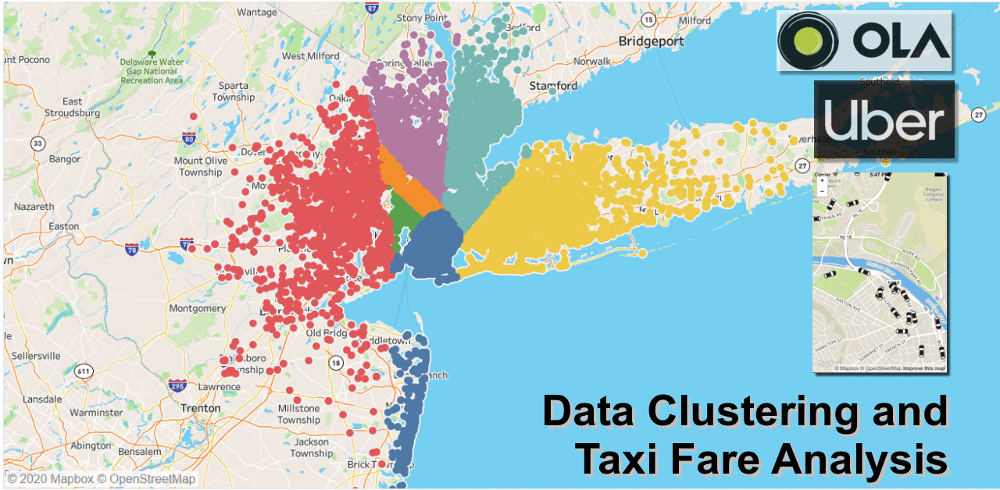

## Submitted By
### - Pratik Patil (B.E.-Mech.)
### - Shubham Deore (B.E.-Civil)
### - Onkar Kadlag (M.E.- Struct.)
### - Mrunalsinh Patil (BSC- Phy.)
### - Ankita Mhasagar (MBA- Business Analytics)
### - Onkar Dhere (Bsc- Computer Science)

# ________________________________





## Under Guidance Of
### Prof. Amrita Ajotikar

# ________________________________








# Symbiosis Skills and Professional University

# _________________________________



## Data Understanding -
## _________________
#### unique_id= A unique identifier or key for each record in the dataset ####
####  date_time_of_pickup= The time when the ride started ####
#### longitude_of_pickup= Longitude of the taxi ride pickup point ####
#### latitude_of_pickup= Latitude of the taxi ride pickup point ####
#### longitude__of_dropoff= Longitude of the taxi ride dropoff point ####
#### latitude_of_dropoff= Latitude of the taxi ride dropoff ####
#### no_of_passenger= count of the passengers during the ride ####
#### amount= (target variable) dollar amount of the cost of the taxi ride  ####

### (1) Data Reading :
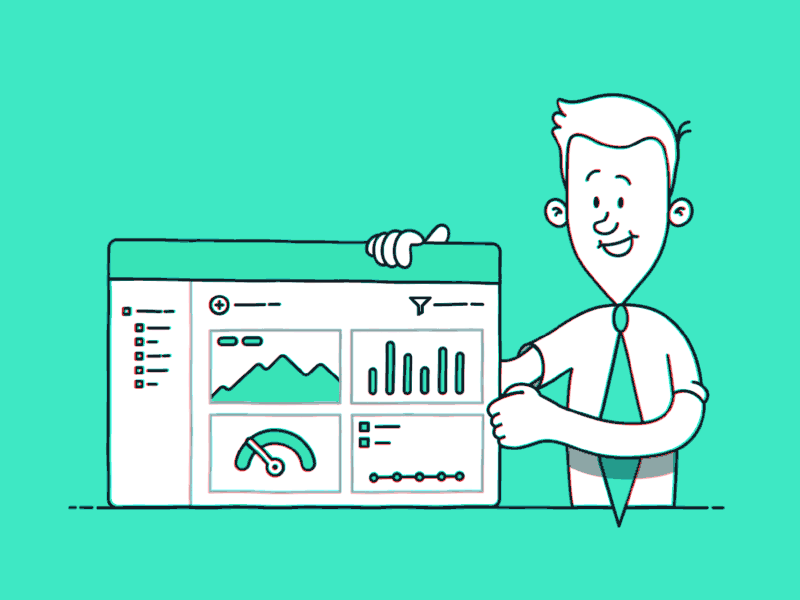

In [1]:
import pandas as pd
import numpy as np

In [2]:
tx=pd.read_csv(r"https://raw.githubusercontent.com/patilpratik007/Datasets/main/taxi_fare.csv")

In [3]:
tx.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
0,26:21.0,4.5,2009-06-15 17:26:21 UTC,-73.844311,40.721319,-73.841610,40.712278,1
1,52:16.0,16.9,2010-01-05 16:52:16 UTC,-74.016048,40.711303,-73.979268,40.782004,1
2,35:00.0,5.7,2011-08-18 00:35:00 UTC,-73.982738,40.761270,-73.991242,40.750562,2
3,30:42.0,7.7,2012-04-21 04:30:42 UTC,-73.987130,40.733143,-73.991567,40.758092,1
4,51:00.0,5.3,2010-03-09 07:51:00 UTC,-73.968095,40.768008,-73.956655,40.783762,1


In [4]:
tx.tail()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
49995,25:15.0,15.0,2013-06-12 23:25:15 UTC,-73.999973,40.748531,-74.016899,40.705993,1
49996,19:18.0,7.5,2015-06-22 17:19:18 UTC,-73.984756,40.768211,-73.987366,40.760597,1
49997,53:00.0,6.9,2011-01-30 04:53:00 UTC,-74.002698,40.739428,-73.998108,40.759483,1
49998,09:00.0,4.5,2012-11-06 07:09:00 UTC,-73.946062,40.777567,-73.953450,40.779687,2
49999,13:14.0,10.9,2010-01-13 08:13:14 UTC,-73.932603,40.763805,-73.932603,40.763805,1


In [5]:
tx.shape

(50000, 8)

In [6]:
tx.columns

Index(['unique_id', 'amount', 'date_time_of_pickup', 'longitude_of_pickup',
       'latitude_of_pickup', 'longitude_of_dropoff', 'latitude_of_dropoff',
       'no_of_passenger'],
      dtype='object')

In [7]:
tx.dtypes

unique_id                object
amount                  float64
date_time_of_pickup      object
longitude_of_pickup     float64
latitude_of_pickup      float64
longitude_of_dropoff    float64
latitude_of_dropoff     float64
no_of_passenger           int64
dtype: object

In [8]:
tx["date_time_of_pickup"]=tx["date_time_of_pickup"].astype('datetime64[ns]')

In [9]:
tx["date_time_of_pickup"].dtype


dtype('<M8[ns]')

In [10]:
tx['date_time_of_pickup']

0       2009-06-15 17:26:21
1       2010-01-05 16:52:16
2       2011-08-18 00:35:00
3       2012-04-21 04:30:42
4       2010-03-09 07:51:00
                ...        
49995   2013-06-12 23:25:15
49996   2015-06-22 17:19:18
49997   2011-01-30 04:53:00
49998   2012-11-06 07:09:00
49999   2010-01-13 08:13:14
Name: date_time_of_pickup, Length: 50000, dtype: datetime64[ns]

### (2) Data Preparation :
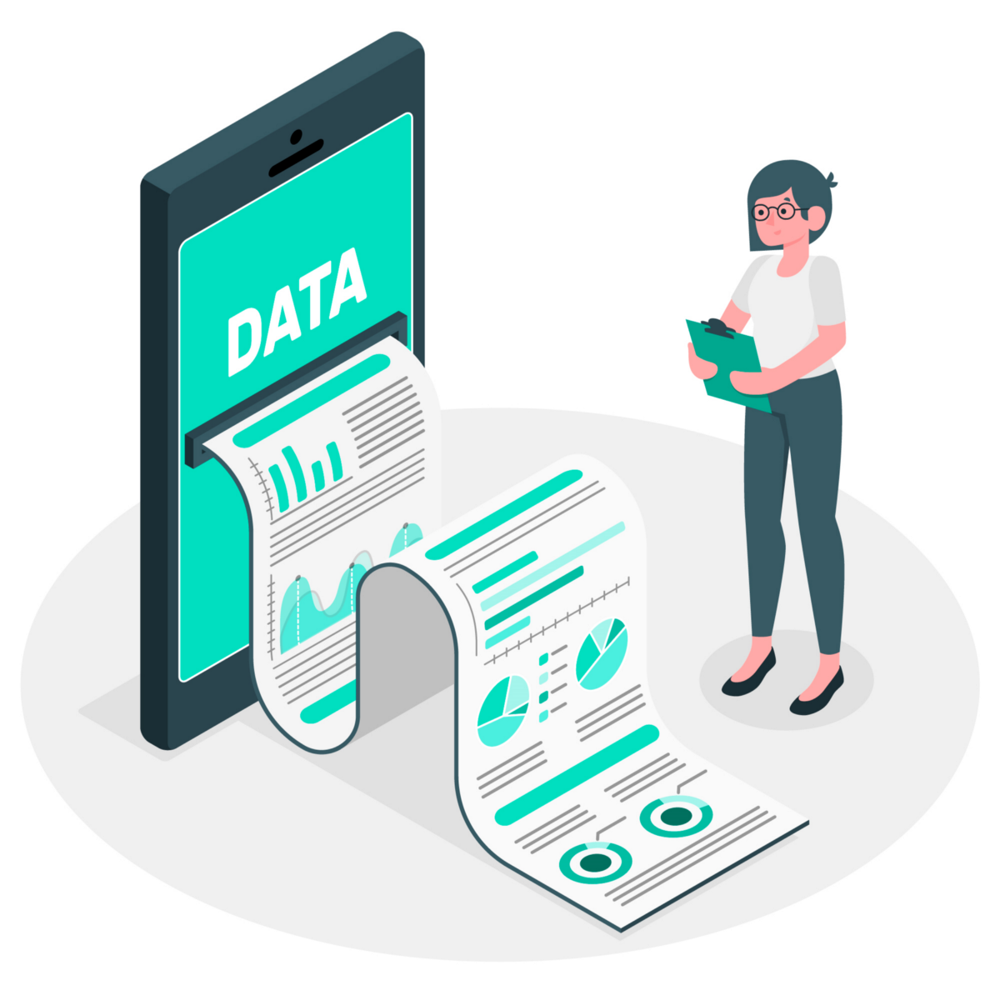

In [11]:
import datetime

In [12]:
tx['pickup_coor'] = list(zip(tx.latitude_of_pickup,tx.longitude_of_pickup))
tx['drop_coor'] = list(zip(tx.latitude_of_dropoff,tx.longitude_of_dropoff))

In [13]:
tx.head()

,unique_id,amount,date_time_of_pickup,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,pickup_coor,drop_coor
0,26:21.0,4.5,2009-06-15 17:26:21,-73.844311,40.721319,-73.841610,40.712278,1,"(40.721319, -73.844311)","(40.712278, -73.84161)"
1,52:16.0,16.9,2010-01-05 16:52:16,-74.016048,40.711303,-73.979268,40.782004,1,"(40.711303, -74.016048)","(40.782004, -73.979268)"
2,35:00.0,5.7,2011-08-18 00:35:00,-73.982738,40.761270,-73.991242,40.750562,2,"(40.76127, -73.982738)","(40.750562, -73.991242)"
3,30:42.0,7.7,2012-04-21 04:30:42,-73.987130,40.733143,-73.991567,40.758092,1,"(40.733143, -73.98713)","(40.758092, -73.991567)"
4,51:00.0,5.3,2010-03-09 07:51:00,-73.968095,40.768008,-73.956655,40.783762,1,"(40.768008, -73.968095)","(40.783762, -73.956655)"


In [14]:
tx["year"] = tx["date_time_of_pickup"].dt.year
tx["month"]=tx['date_time_of_pickup'].dt.month
tx["date_of_the_month"] = tx["date_time_of_pickup"].dt.day
tx["hours"] = tx["date_time_of_pickup"].dt.hour


In [15]:
tx["hours"]

0        17
1        16
2         0
3         4
4         7
         ..
49995    23
49996    17
49997     4
49998     7
49999     8
Name: hours, Length: 50000, dtype: int64

In [16]:
tx["month"]

0         6
1         1
2         8
3         4
4         3
         ..
49995     6
49996     6
49997     1
49998    11
49999     1
Name: month, Length: 50000, dtype: int64

In [17]:
tx["year"]

0        2009
1        2010
2        2011
3        2012
4        2010
         ... 
49995    2013
49996    2015
49997    2011
49998    2012
49999    2010
Name: year, Length: 50000, dtype: int64

In [18]:
def time_of_day(x):
    if x in range(6,12):
        return "Morning"
    elif x in range(12,17):
        return "Afternoon"
    elif x in range(17,21):
        return "Evening"
    else:
        return "Night"

In [19]:
tx["time_of_day"] = tx["hours"].apply(time_of_day)

In [20]:
tx["day_no"] = tx["date_time_of_pickup"].dt.weekday

In [21]:
tx["day_no"]

0        0
1        1
2        3
3        5
4        1
        ..
49995    2
49996    0
49997    6
49998    1
49999    2
Name: day_no, Length: 50000, dtype: int64

#   Day:
## No     Day

    0        Monday
    1        Tuesday
    2        Wednesday
    3        Thursday
    4        Friday
    5        saturday
    6        Sunday

In [22]:
tx= tx.reindex(columns=['unique_id', 'amount', 'date_time_of_pickup','year','month','date_of_the_month', 'day_no','hours','time_of_day','longitude_of_pickup',
       'latitude_of_pickup','pickup_coor', 'longitude_of_dropoff', 'latitude_of_dropoff','drop_coor','no_of_passenger'])

In [23]:
tx

,unique_id,amount,date_time_of_pickup,year,month,date_of_the_month,day_no,hours,time_of_day,longitude_of_pickup,latitude_of_pickup,pickup_coor,longitude_of_dropoff,latitude_of_dropoff,drop_coor,no_of_passenger
0,26:21.0,4.5,2009-06-15 17:26:21,2009,6,15,0,17,Evening,-73.844311,40.721319,"(40.721319, -73.844311)",-73.841610,40.712278,"(40.712278, -73.84161)",1
1,52:16.0,16.9,2010-01-05 16:52:16,2010,1,5,1,16,Afternoon,-74.016048,40.711303,"(40.711303, -74.016048)",-73.979268,40.782004,"(40.782004, -73.979268)",1
2,35:00.0,5.7,2011-08-18 00:35:00,2011,8,18,3,0,Night,-73.982738,40.761270,"(40.76127, -73.982738)",-73.991242,40.750562,"(40.750562, -73.991242)",2
3,30:42.0,7.7,2012-04-21 04:30:42,2012,4,21,5,4,Night,-73.987130,40.733143,"(40.733143, -73.98713)",-73.991567,40.758092,"(40.758092, -73.991567)",1
4,51:00.0,5.3,2010-03-09 07:51:00,2010,3,9,1,7,Morning,-73.968095,40.768008,"(40.768008, -73.968095)",-73.956655,40.783762,"(40.783762, -73.956655)",1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,25:15.0,15.0,2013-06-12 23:25:15,2013,6,12,2,23,Night,-73.999973,40.748531,"(40.748531, -73.999973)",-74.016899,40.705993,"(40.705993, -74.016899)",1
49996,19:18.0,7.5,2015-06-22 17:19:18,2015,6,22,0,17,Evening,-73.984756,40.768211,"(40.76821136, -73.98475647)",-73.987366,40.760597,"(40.76059723, -73.98736572)",1
49997,53:00.0,6.9,2011-01-30 04:53:00,2011,1,30,6,4,Night,-74.002698,40.739428,"(40.739428, -74.002698)",-73.998108,40.759483,"(40.759483, -73.998108)",1
49998,09:00.0,4.5,2012-11-06 07:09:00,2012,11,6,1,7,Morning,-73.946062,40.777567,"(40.777567, -73.946062)",-73.953450,40.779687,"(40.779687, -73.95345)",2


In [24]:
index_names = tx[tx["amount"]<=0].index ## To remove negative fare entries
index_names

Int64Index([2039, 2486, 10002, 13032, 27891, 28839, 36722, 42337, 47302], dtype='int64')

In [25]:
tx.drop(index_names,inplace=True)

In [26]:
tx.shape

(49991, 16)

In [27]:
tx.dropna(inplace=True)

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='amount'>

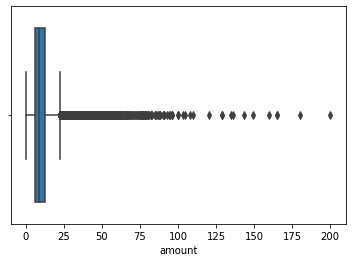

In [28]:
import seaborn as sns
sns.boxplot(tx['amount'])

In [29]:
# IQR
Q1 = np.percentile(tx['amount'], 25,
                   interpolation = 'midpoint')
 
Q3 = np.percentile(tx['amount'], 75,
                   interpolation = 'midpoint')
IQR = Q3 - Q1

In [30]:
IQR

6.5

In [31]:
Q3

12.5

In [32]:
Q1

6.0

In [33]:
# Above Upper bound
upper = (Q3+1.5*IQR)
#print(np.where(upper))

In [34]:
print("upper bound is" ,upper)

upper bound is 22.25


In [35]:
lower=(Q1-1.5*IQR)
lower

-3.75

In [36]:
tenth_percentile=np.percentile(tx['amount'],10)
tenth_percentile

4.5

In [37]:
ninetith_percentile=np.percentile(tx['amount'],90)
ninetith_percentile

20.5

In [38]:
tx["amount"]=np.where((tx.amount>22.25),20.5, tx.amount)

In [39]:
tx["amount"]

0         4.5
1        16.9
2         5.7
3         7.7
4         5.3
         ... 
49995    15.0
49996     7.5
49997     6.9
49998     4.5
49999    10.9
Name: amount, Length: 49991, dtype: float64

In [40]:
# Remove latitude and longtiude outliers
tx = tx.loc[tx['latitude_of_pickup'].between(40, 42)]
tx = tx.loc[tx['longitude_of_pickup'].between(-75, -72)]
tx = tx.loc[tx['latitude_of_dropoff'].between(40, 42)]
tx = tx.loc[tx['longitude_of_dropoff'].between(-75, -72)]
print(f'New number of observations: {tx.shape[0]}')

New number of observations: 48945


In [41]:
tx.isnull().sum()

unique_id               0
amount                  0
date_time_of_pickup     0
year                    0
month                   0
date_of_the_month       0
day_no                  0
hours                   0
time_of_day             0
longitude_of_pickup     0
latitude_of_pickup      0
pickup_coor             0
longitude_of_dropoff    0
latitude_of_dropoff     0
drop_coor               0
no_of_passenger         0
dtype: int64

In [42]:
tx.shape

(48945, 16)

In [43]:
tx.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48945 entries, 0 to 49999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   unique_id             48945 non-null  object        
 1   amount                48945 non-null  float64       
 2   date_time_of_pickup   48945 non-null  datetime64[ns]
 3   year                  48945 non-null  int64         
 4   month                 48945 non-null  int64         
 5   date_of_the_month     48945 non-null  int64         
 6   day_no                48945 non-null  int64         
 7   hours                 48945 non-null  int64         
 8   time_of_day           48945 non-null  object        
 9   longitude_of_pickup   48945 non-null  float64       
 10  latitude_of_pickup    48945 non-null  float64       
 11  pickup_coor           48945 non-null  object        
 12  longitude_of_dropoff  48945 non-null  float64       
 13  latitude_of_drop

In [44]:
tx["no_of_passenger"].unique()

array([1, 2, 3, 6, 5, 4, 0], dtype=int64)

In [45]:
tx.describe()

,amount,year,month,date_of_the_month,day_no,hours,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger
count,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000,48945.000000
mean,9.957625,2011.738993,6.274717,15.662969,3.030831,13.483665,-73.975146,40.751122,-73.973988,40.751579,1.669364
std,5.129779,1.865353,3.461848,8.660077,1.956553,6.503364,0.039726,0.030840,0.038647,0.033586,1.290258
min,0.010000,2009.000000,1.000000,1.000000,0.000000,0.000000,-74.711648,40.121653,-74.755480,40.164927,0.000000
25%,6.000000,2010.000000,3.000000,8.000000,1.000000,9.000000,-73.992300,40.736519,-73.991333,40.735903,1.000000
50%,8.500000,2012.000000,6.000000,16.000000,3.000000,14.000000,-73.982120,40.753445,-73.980479,40.754119,1.000000
75%,12.500000,2013.000000,9.000000,23.000000,5.000000,19.000000,-73.968396,40.767764,-73.965320,40.768484,2.000000
max,22.100000,2015.000000,12.000000,31.000000,6.000000,23.000000,-72.856968,41.650000,-72.854940,41.543217,6.000000


In [46]:
from geopy.distance import distance

In [47]:
def cal_dist(val):
    pick = val[0]
    drop= val[1]
    dist=distance(pick,drop)
    return dist

In [48]:
tx["distance"]=tx[['pickup_coor','drop_coor']].apply(cal_dist,axis= 1)

In [49]:
tx.shape

(48945, 17)

In [50]:
for ind,d in zip(tx['distance'].index, tx['distance']):
    ng=str(d)
    ng=ng.replace(' km',"")
    ng=float(ng)
    print(ng)
    tx.loc[ind,"new_dist"]=ng

1.0296007435005075
8.443441363128793
1.3891321598447868
2.795789657815209
1.9983378357761605
3.787980068807063
1.5544462802770207
4.159930252748008
1.2555073729326163
2.8470284110754713
1.3776370664464568
0.7195983130843497
2.016896545314358
1.669479180666655
2.606419815183223
1.5130419624080873
0.9241914857262769
0.39866461235271256
1.6854486810910387
2.2896004596984283
0.9242441045074824
1.4059235139303587
1.0200186949126995
2.530955259514268
0.3288400683006587
4.069585869797675
0.8070951411529314
0.8715595199155847
6.697198501115986
9.427201062946969
1.3835785159061689
7.141191457180988
12.770770508471237
0.8063480731629884
0.9535595605080608
2.345112292778306
3.581361842117139
1.6415277055958022
5.0114715065713575
5.745018977246291
5.454207522798914
0.9492392434124526
2.5457719621183577
0.9943496926530531
0.4618968353489342
0.5500748793854104
1.6469698582303247
2.4975367937994593
1.0123978327534484
2.2821026555503336
0.20728772008567928
11.592351612906379
5.037496126659036
9.657731

4.27625124888351
2.4751048165114846
1.018000014721136
7.373558890521507
1.490102308662611
1.2259707858631361
4.410602074256416
2.5168906924089627
9.392185975550703
0.0
3.123032700731461
5.110549127032576
3.6413026180365575
3.6125960508091484
1.3294878971576836
1.303439462395481
2.878676562030213
2.482257833052645
0.9880534624003129
5.078753662676913
4.848132526338565
1.594766231685555
4.365287411478411
3.344885669653326
1.1215860104983566
0.9073992729619527
2.0296228873469184
2.6862184178276522
5.256020799735706
1.3185208864542133
13.11266912225205
4.852529031616154
1.174948298805673
4.348078102992414
2.165018414017135
2.434514032528255
1.8796586949054337
8.35052608200257
0.8802458923844217
1.8922664346304117
1.7938004563023682
1.372312615454666
4.693068105666967
7.164946806431711
1.862773746321291
1.4323100365507864
12.98406072365227
0.9324176481275782
4.365072352871809
0.9978777950243702
2.5578803953474587
4.166854302111648
2.7491908144938195
5.116096599056788
0.3195537632856193
4.34

4.721994337606529
3.599018828998845
5.94359197156544
2.093949390017974
0.9564658209764259
1.4081044288418139
1.2480244381207506
3.883546519003713
15.247497695855003
0.5382145634788489
1.8432339722320328
4.033696129813783
4.479050562071105
3.9694900222230487
0.6777723963135234
0.8255222652974956
1.6306660019017463
1.0588605537657227
0.5625180406799862
0.48193201529224017
0.4568166808953062
3.4880507826525546
1.803059244546923
3.6582857025590396
0.959285859129642
1.6851932320306349
1.641201100326888
4.072523477910031
4.173856601880219
0.0
6.6499934756133765
2.9656992261141437
1.2950829933645256
3.6251810265572866
3.9354752718468546
1.9149373271444672
2.183374495657984
2.405900091656749
1.3413939321582953
3.9176121955280916
4.522256252734016
5.1566936173607205
13.086755292554814
2.842665874383282
14.173412890676758
4.881478455393113
5.967806283006695
1.3594205173284266
0.8639391747144965
2.968622556393607
0.86481608042075
1.2530111096706351
2.611376727069058
3.4878897892880443
2.686923093

1.0792893260843044
0.6469920487334305
4.377416749812357
0.8038628832549682
1.8558171966001917
0.9837558289172441
2.8968581923228163
2.450022193245734
1.281535982918181
0.16423941317186388
3.9491183723817316
0.6665469141427134
9.877845104568022
14.437668351980475
5.784715705588657
0.8944181950131278
0.01041695151880627
1.0723543290892845
7.084206523512926
4.955293498487911
0.127873228811542
0.4470814162878308
2.5995490249625046
0.5425953583379618
5.5968390639797985
2.910092892525387
11.980746303250948
0.7354506133954504
4.049481125274691
1.6385212154511344
2.1212295609762264
2.607695116436188
4.546721539126299
3.201253470779614
1.7233265355098524
8.245663039985955
3.020333255030748
4.677622034660057
4.891274817338132
5.392294084404981
1.1164130858564016
0.9548478896143665
3.38903102028464
5.957319616228802
2.617723045015131
2.5403956768841987
8.798198026971749
0.6158197164654293
0.6189706841209722
2.0706306180464793
1.7240924776207605
4.067818546411972
1.3794220345477288
2.1376739588342

3.248133344325576
3.9543577222084116
6.560904482433625
1.0015014719784523
1.7443636112866105
3.5084320822923982
14.557983188497554
2.382068939476508
1.4893819100730252
2.1285129668938247
3.765209143098689
2.5349288321478864
1.3704260476061751
8.35500450026235
0.6316242039135769
2.812965106499253
2.3995619592041444
9.539279429723987
2.405074417797604
3.592617823609396
3.8540675325419995
1.059725169853609
0.9123723987862618
1.0442585920667655
3.9138887564602767
0.6941506069240341
0.8442320776200856
15.500526546933493
0.6819367397058121
0.8326762521437914
4.673241156332085
1.048139139986738
2.2766894110251625
7.654838147718982
3.75878190274149
2.1536500375623087
4.47690142452477
3.112487515724728
1.7766590626461496
1.3187526601978552
1.0272165816642158
2.8804801991535873
2.807453129463841
0.421411042730512
1.339851834019756
3.1778491565983105
12.240643045516265
0.7695723442271232
2.035535497895411
1.990844538141644
2.4716917271815366
2.4797797675363027
3.2480824737145184
1.59100150043097


2.5580540837696577
4.854405019420756
1.9538578213369373
3.974700561569793
1.8822915755849123
3.0082639292874442
13.097840803220603
5.6222720878323384
2.271320974293552
3.3059387481901266
4.114621893583513
3.4780710279822133
1.6118716876001968
1.8571223721007784
4.891251199860377
1.7333549051281212
1.3339578084711599
10.631504889352344
1.6123793610012311
2.0013089460224154
0.7861255378143384
5.834820873598845
1.4288602400785095
3.312739567595025
1.1801706547139321
1.6355379468902074
0.9542089163602064
0.9086161987422577
1.591726653947247
3.293920757671876
4.1923105534360845
1.2239462400270666
9.62371607593898
5.908276705647073
0.5158387249121186
1.1390166384651148
0.6342568115361611
6.441477864499684
2.1329182443187227
1.5782854123284218
2.742730861031629
1.0002980864904667
2.044274658693816
2.1163051161175823
2.000680838661192
1.0606184493310131
2.374047728595753
0.5675293081060132
1.812402657290694
3.237114811370442
9.063509405378444
0.7280372330181064
0.0665187608066788
2.70654449229

3.5402838840608597
1.3617340268242455
0.7181531119915368
4.624898539650966
0.7300983635914103
0.8361763286048346
0.5010133106072786
1.6384347955784175
2.084783672382776
1.2255697807845245
1.5272788632708079
1.577347752024425
2.0792642874074425
4.849014882755379
1.8091887143267937
1.5986249488016204
0.0
4.012703940895309
2.310068077090137
1.500511520686479
3.7388135181788558
1.0728467810663225
15.327232722409969
2.465715984977164
25.701540444167488
2.6212893390921193
2.99536355812953
1.9184027141816111
3.1131430930765873
0.780477411360552
0.4237466438066861
0.7817476325298663
2.7101532533194965
3.688796618793431
1.9479399982177594
2.1847166993349676
0.8511950641051301
2.6614679022162866
0.0
0.5804118348479986
5.040198559626527
1.892145315307647
3.0086385417916364
1.2407751713816013
8.472426588308489
2.5745892936465964
0.8031841773888156
10.848530841497459
1.6684715437730713
7.674153018398691
0.6162715829760705
0.5918604672987948
1.9527235706062083
6.164564005665047
0.6048708816716459
2.

0.0
7.75942525628855
1.3267703139284297
0.0
1.1287166389065646
0.9473477025961473
1.2350582544722142
1.224027809529195
0.7185484342701112
2.4701364800992534
0.7041860400382918
0.5065849657075996
3.4475100731134507
1.6097055216930656
1.623878974349718
0.8327547255941921
5.141853171864042
1.2599004096081259
1.6774384279874845
0.8726672082880738
4.883513329488744
1.9112270961358793
0.7773655487251357
3.358613199708242
3.732180790495668
4.796033234526062
3.8300978173876414
1.0089524961038536
0.9746523781958137
0.4879998860011393
2.2091551146762916
1.7704412172675557
2.643007591251729
3.8129844882118293
0.9423089296995658
16.07736037753044
5.231975556111426
2.7658170930052153
2.8530323976851606
2.4367615754687906
1.7666972046452805
2.0632417442494604
0.885322948921576
1.8189091160448443
1.429950860904739
1.622845986796841
1.9286893545753405
2.2821408419295968
2.6693163914098585
6.090239901959971
0.9074149578156813
0.8418025992356972
0.34243264678607194
4.026225535360504
0.8908185305681918
2

5.684036414655028
0.0
3.5744869069258547
1.7145498061943576
0.959127603646449
3.563484685019702
0.9502762402023044
1.5354581633817115
1.8591481752876624
3.4310713906618067
1.1516492544215895
0.5353684195378715
3.914464845973783
14.878649577694976
1.4685151210141447
4.760828224519493
1.227671468515935
1.7207858562770566
1.1727909981722364
1.1542930674290262
2.3155619841896153
3.680818620924854
4.265812791501286
1.543180911171206
5.171246607949721
2.95620454976666
1.1399434441939222
1.029700931647783
0.4647285132261764
1.8508989192240382
6.503802844564545
2.346937859560338
2.2483934420176257
1.3192329156005551
1.5034366667716592
1.7259382848200142
2.9886075481471175
2.029444988986187
0.79977794647508
5.248754571692046
4.815876263844772
2.997268549457367
2.4178769599654064
1.8851530699602845
1.2183977999171671
0.0
4.0167071146346975
2.5557687464638703
1.5354423300067355
1.3890138614177017
3.431839275817053
1.074137166817732
4.089368397931607
0.7448965827719246
2.36767308170353
1.680155854

0.5229308934438228
3.068806755822193
20.06982723917939
5.648883887698958
2.1775061793360044
2.9771336711230254
2.336720259591503
3.298373625703396
3.4516779398442345
1.2023091276913551
0.46491569795243914
5.128829841764619
3.7340907839649775
1.8865236099318754
2.620475009320084
1.7496761493872424
3.8417872284156247
4.375527410114338
1.7592330175538478
1.3389579856283453
2.8135301450240813
3.1524167717716325
1.46595192475919
0.9992163545736188
2.7384845782874514
1.3124276606083636
1.7008240671211625
1.2963866701129496
9.810832167951821
8.61128308740039
2.397671183834652
0.7583132293147612
9.815286634809787
1.4117012986040889
3.6254071015008824
1.0232623185537844
0.9826698059343963
3.537344308284172
1.258573073373603
0.6105192119682776
2.4004430520853917
2.176583993963499
1.5565667426660483
3.2024466559324307
2.5735373809976774
1.265972868600875
0.8316724975208777
3.793861662324212
1.5812839821390166
3.8776245232985276
1.7893306145056969
0.7455166546192007
1.7651446106033533
15.392218276

0.5284699143455033
1.4704322698312495
2.592776036401243
2.109683004301547
2.4803886550070784
8.442542352868074
1.3408115427971656
0.6439684405585093
1.5171154601619918
3.122347588797091
14.215464600615483
2.175911619412349
1.1298053001555104
1.1350667386385198
2.3650571154831277
0.6686833058456079
6.110115888549524
0.5981923611332587
2.0424415592351
2.318179568280052
3.116877902099136
1.2024595468019124
1.9008841134847423
6.557010354598323
1.053789367499806
0.7669078324731503
1.3717868417302819
3.389699090661875
4.598725164406713
23.454200727947047
1.3323475430402956
2.4188450619697983
1.7746726561573225
0.0004751728851469985
1.683235927440673
1.5301383376924569
1.0191247314226832
2.529734500570722
4.05549181363632
4.307852910222674
0.0
21.036944346542704
1.9375271547454662
4.36365603908653
0.24230319365149627
1.8666384651987917
5.333438267482788
0.8753684789496913
0.8089271723100847
1.0113740450831354
0.38045587191092467
5.786180132887331
1.0929952356649162
4.166304061202283
3.6888873

1.0183706645378683
20.418908269235715
0.7430456668937911
0.7119708347867145
0.8032319065506037
6.87172827958363
2.8787361797736404
1.5688467639739072
0.6397191976263673
6.416389182316408
11.628656505033062
4.077045732179366
0.8568304618906775
3.682097749573346
2.5016264255604783
2.820220350566464
2.241502681315826
0.6093456483732974
5.399553276732916
2.8686302686862084
1.0497477500728136
1.2725846693371374
6.876179131596923
1.3726224778393645
4.309930048871458
15.311207610137963
1.4444595899025223
1.0302671388765778
7.84564916315486
3.8961911166314502
0.6084411107496575
0.2403343122040943
1.3390723176841814
1.9993317508688615
2.631197569515026
1.2369300146464346
2.114317529760393
2.1936509451972293
2.5081321588579826
8.40801086697751
2.726667122964239
0.8201443244854817
2.5705161152182323
0.581640829756939
0.5566835358635065
4.6236559141215485
2.2918118572277213
2.6724007617440257
6.727655482819268
3.593476977766509
3.485200733122575
1.4981560261779996
1.60387509857808
0.70692452263874

2.400009359395482
3.550998830886716
0.8631642009840039
1.899399435701491
3.5533858493343193
2.2804564160421315
2.5883314313584256
4.964372909306019
0.5676161702358543
1.3221953363440822
0.7487361549554413
3.7142011821249907
3.8154903028450886
2.2975178743723155
2.9709768457390306
1.5831695706443918
1.1369875355951458
6.158836187258536
1.8101261137252316
0.982953414356184
0.5537011445483984
6.14941790482056
2.086156063049306
7.4969539235672205
4.301356924023556
1.3422972827154245
7.519449654239542
4.509792871130021
6.904627913164033
1.5033080329335708
2.487193616375128
6.727479524865375
2.1547898805688126
1.3333009592948342
0.8032580765885952
1.8903586748318868
2.7851731864118183
7.053172883624119
1.6407168501192178
8.750796665282262
0.8130319450960445
2.6856688994783853
0.6566525872175035
4.770032567227194
7.358595363469984
1.6042795370508884
7.354518201321873
2.149306855301035
6.053222580967938
1.7430292500065803
2.7151797702815985
0.8328163184131457
3.0488351442907526
2.2443674480108

1.7822199922049902
3.8085816122931373
21.933043565773595
0.7938528002752459
1.4545915143208699
1.212692276525332
0.5079532376408252
1.7237982064978825
3.275850658039609
9.711786096793334
1.4272378963404193
10.280367897709468
0.9463871349106239
4.293777577698378
2.920662685495732
1.8206579798494158
4.083168577805994
3.036302539268815
2.556342378992413
0.6619480588359682
1.0658528559722837
6.00493529695106
10.607836203460819
0.4672272223542073
6.8165299906139625
2.923980852085398
2.4080982024022117
0.0
2.312160751712277
5.475065058240587
10.22276226108356
1.509665299380406
1.5623362502284652
1.7221691673973036
0.7767563953029767
2.2651811102103117
1.9437083310255119
2.6401948590769044
4.446621425989334
1.9352861475622745
1.7150960348311468
2.0775435930079653
8.115593770343644
1.942627255185828
2.8806245806125648
3.609474003935947
4.064819750179288
8.169963232868328
6.974108174749324
1.4751512691823299
9.312440163346576
10.627073404423532
6.3521358696280625
0.7599270807935199
2.2388505329

1.765428708439257
1.7208748008778174
3.535257480837285
2.462865056933084
1.6183718878652862
3.3257239200009066
1.2656370995898483
2.3007764015807477
3.3725406274658516
2.0356100158971224
5.900005055037503
1.8130707149896925
2.553713674169449
4.5095984311610255
0.7885223463596206
7.0662312823189035
0.749166018952261
5.374473922602587
0.5219293544295197
1.2231060366764426
2.8470926759740625
1.9838968816533662
1.7901109362055139
2.3888402678916245
12.749131247055766
18.98161771848074
1.39603468775158
1.3323718672945306
0.6373163652141003
5.601379756657059
0.5233834826674808
2.004874563437684
5.440602580924191
3.1343618482993394
1.4574980286376618
5.498159699097152
1.968065720035065
1.263167683806823
4.447458242074293
0.7343419711726997
5.347967632067295
0.9115536141529812
6.204584100331728
2.1330616290680973
1.2968373559360737
3.336430994866621
2.809628037004379
2.394518834018911
1.13784158864099
2.3896131293447502
1.81087087486452
1.788166739774871
2.1404606127293397
2.7563446068537583
0

2.3925216649797405
12.73542521050967
0.8886398852572981
1.0094694702397389
1.5888113605434575
4.549094469734969
0.7256910388600716
1.37917801155515
1.133254479181147
6.263125994136084
6.348113029741596
4.143003268938614
0.9883976555328762
1.0271165424954602
1.5740189045203892
0.8352444074329093
4.891266243314979
9.735101295032981
4.500076569503917
0.7147570947128804
1.4768711543806599
2.447224137166448
1.0966923337983934
0.19928267732548335
2.916924500758515
1.1393225537107188
1.4734622201820853
3.855025489883199
3.6772737105660935
1.9307452416111917
1.3559854491992158
4.169821423914557
6.420566102149681
1.2842048455740542
2.2757178577356454
0.7012598231637054
0.8303216465582701
8.796106018761218
1.1066902598585087
0.011397626037886261
1.6199690661048367
1.5106543091316098
1.5024287683211308
9.627174056598877
1.7452878297602423
1.2320111775321085
0.405619788844124
2.3640281305846846
6.279071021488929
2.467973334572518
1.460648744868219
5.404548061933643
3.743526793655992
1.399449309708

1.593286975120245
0.34230848371614686
15.511069447205239
2.358678920691178
0.0
4.192939018367517
1.2084650545808022
1.2288460165512498
5.684626508458509
2.8364970311257656
4.3001720310246085
3.307845633422946
2.223632421302001
20.5490448088552
3.5823856912786987
1.0714048282544866
0.914899066542421
0.31516071741691404
20.199430412532354
1.287876499769925
13.608392333015123
4.933283017145327
1.2386947672194368
3.0378181852359334
1.7240400681939458
11.15129971209032
1.512960462356592
5.559372779592456
2.8812139930891427
0.42420110972371583
0.9328485846308672
2.0108769426554027
0.9083129675954297
3.242818172656919
4.555853355811149
2.1822271264162527
1.8441507528124772
3.6066549238324925
4.0888320185821385
1.3683985052602556
1.4035843219365505
2.97423238450289
1.0640882393058222
2.451490901630352
1.1726165027604138
6.745871026105412
6.838530661289646
2.614922108086638
1.4079616354308928
2.1465642138743815
2.34142971535372
7.7843709854702885
9.602557384644994
2.870481083234492
1.2176511194

1.1565556694736112
1.5649820415500961
1.4836661576277488
5.839250684119643
1.1766253211324742
1.5363653361670941
4.63087860821309
2.8210637969035752
3.373791414315694
2.898051032882681
0.26919312567723985
11.924512610286122
3.0938854608519732
1.2574035231931002
6.906183740190326
1.5187165850055353
2.208507680483115
2.1119375264575604
1.5172582786733797
3.9180237785481427
1.3951157378547465
0.0
3.004812553539872
3.2747987635353555
1.4572684250602312
7.446301409741871
1.1627416081892363
3.969208653961356
1.515973645200606
1.8743765478164918
7.395327687064306
3.7110881082284575
3.1231730424814415
3.0275740143644185
5.220469447991311
8.24804027499563
1.452836736527399
4.78547068340203
2.552402822806304
3.923853646535286
1.4397535086586246
9.07964705473877
1.7347240153027959
2.6193824823151712
0.9069566876448008
1.0168382235275615
1.2034341013990912
1.5306313631230783
5.886864098521609
1.1727210598668039
1.482120143224314
18.561931503311474
1.2557583670393075
1.172853857006625
1.93017061375

3.93560612741008
2.7573894898157434
1.6213935297788842
2.1379424985193554
2.0937455909533345
1.1794318610129966
1.6056473466597512
1.1321422939280834
0.614458119180649
1.8503793680989444
23.81505322234458
1.048830633659432
5.195488951758444
2.1458208254100732
2.544824938378801
5.342763320118366
1.6441199090258358
1.3993102418311734
0.6762933720893578
2.4775517875728497
4.120204270541068
5.690206816853516
3.132169982667341
3.820282878724882
3.0831577505939367
2.494949219127294
1.2168957569598045
4.359349858817915
0.723824475608568
11.369546368066494
3.1888415551664306
19.89105689102704
15.119023558389271
1.1990272685361099
0.9464269055661121
1.299700971096364
5.984307807374543
1.0047976516477792
17.85936017402362
1.9959396705249708
2.9400227109572357
4.197494327862914
2.2909016558891726
1.5424853901820306
0.7076178234439102
8.057086692226804
3.9089003723124174
3.10696750270605
2.8909178007105236
0.7924687574167395
3.2215404778382384
1.3391056353275497
2.1525593829195753
1.71171572213763

3.1969911292405433
2.1897198407457084
0.46073135028948464
4.124614179382928
2.2601454877417955
1.1963267177519865
10.183255734251073
0.8834155843943599
0.5794943002427985
8.346702887832711
1.7409197258967777
1.033984235742654
0.10613549734088633
2.441935333121629
0.9672134716635022
2.68837269131578
8.999744315987709
1.5188800965161564
5.290120428916547
2.3402200146513827
0.9930773772582967
1.8764586789736293
3.656911204958003
1.365827193829512
1.0685466500063412
6.180004381585069
1.7918621801160575
1.0346666196107637
1.6756869947166038
4.0027968817887825
9.744705468751999
2.9698928465786008
0.8414458834677059
13.475663301456045
2.186475829233231
0.0
4.161795893419687
9.767545120586476
1.1609057373680989
2.4694813477213735
1.255002306087542
1.1006033073601986
4.68290725221215
2.4206390408381657
2.875739494701461
3.8837111070340806
0.40223121861289723
4.8888632032187145
1.7615172032618958
5.7042832835201835
3.1268072454571803
4.750144499850487
1.4172454791603655
4.117539456887485
6.46900

3.009746408039107
1.2340039361500528
1.3988815776989723
2.0875603357612804
1.1703915644728629
1.292148702709253
1.3528664573215377
10.066001445564192
1.8589390809302702
3.792488606654435
8.607671451933523
2.5631391721911587
1.7632971272058606
2.709129199986907
3.793012935621676
1.5205876392651196
1.0702455175068373
3.2310532914360497
1.2664178155268149
1.4144449030478818
3.1325845147777645
0.8419571930520177
2.136587403773427
2.7502065105383755
2.0237619982027906
0.9217868734239363
2.6367081434720245
1.802955570790098
0.8323708505355788
2.3516181365217563
2.2443997892593814
3.7947515486442778
1.8360277975377148
0.7645306928646598
1.2719048293403148
1.3024341394468322
1.8824841013491336
1.7827401186054594
3.5062187787030656
1.3769586277921726
0.7105472845001436
1.6697597202865246
4.23917638345688
5.943346238137491
1.1717764966074644
9.72590719454779
3.5534907735497563
1.654509900029117
1.0769361321599198
1.1619489913389416
0.8965499489881934
1.4041777979805778
5.1778473805021825
1.14903

1.1170571828264675
5.121324719459317
2.1404015829344485
2.286920966985417
0.003402903771302535
1.5523658569617151
0.3530779871953739
5.871050794157788
1.9369977123522144
2.9995032172326033
4.101168387403343
6.068745807980777
1.992111916380646
0.9415147300683742
1.5218001649070458
1.3301362485191632
3.044813783121626
2.9391079243456235
1.805010344070092
2.6563586877366285
1.7004983237347777
9.835640537877815
2.790146013134775
3.8515784851525003
3.87175894964717
4.567246342056404
9.834478309181002
0.8815760502136463
1.1839999264565284
1.9279547724446287
4.412486823875364
2.380253428398333
2.62055891167748
2.147666944832134
1.2697275190702593
1.4030965574053966
0.8756989361993582
1.3836819706146923
0.8531393806716311
1.132751376150951
15.13245417066565
1.0826990184658563
1.2600119130758014
4.99459428933974
1.3619955331039757
1.5769303683435123
2.1697805374267536
2.65895715242003
1.451927194004513
1.5015682363466258
3.509276243083515
3.858577643738255
2.6138579074372505
0.9931831140222555


2.7145224589257477
2.412543554450409
0.7154630843103836
2.625748457475991
4.335554574753088
2.9150119911400405
1.8055146506059316
9.83428434277801
1.3645124725216409
1.661503828809232
2.600812308118277
1.0997707719879164
0.9720122133740848
3.689309580116293
4.484700606684897
1.966698847211802
3.9771007167235464
2.400122346701204
1.2093425501644735
1.3286708205413615
2.222885946608596
0.56645209005076
5.3530931200205
1.2368682558531057
1.1109703491807614
1.2754466447085298
2.1398391953612035
2.1588935204124464
4.694885939376773
4.521703121672323
2.281295793420125
1.5509341836078354
1.1623774503469735
2.5720933973171713
1.353617551861076
1.2036324942613177
3.896351416743446
2.4105402973831302
1.2158714474484666
3.5800246719003606
2.6978943704744474
0.6528906048460148
1.172068111424206
4.297008000278613
1.9640808509903964
6.293275142296054
0.8612007918583915
4.281812288237187
1.3895025019236231
1.9525046806337658
1.2029906243549846
4.250597369959957
3.3044892417468
3.578213623905412
2.404

2.9074374003629955
6.893021934006338
7.502418500576647
0.7848546044624449
2.598054169867806
2.6722822031747397
2.393021055088145
1.374728742448668
6.108649337963326
2.1717772941287525
2.916156388047203
1.7351719614926628
8.936883261828083
3.7949869933295974
6.2680416914465695
4.052512890295545
9.847870828848434
4.8061699149968105
6.823104278998987
5.851177328646199
1.3546393004195578
1.060534832828912
9.255655316340837
0.7680921402702741
3.6409401713702905
0.5511970675810328
1.5451111726618545
2.91972616595231
1.0616717965176374
0.890240331150405
18.580119058417168
12.841447276068907
4.315820833808486
0.9179116707173388
1.30839549143569
0.0
3.991658627033731
2.2615696347268504
4.8660858512988385
0.4695126828272051
12.573582641824348
1.4292607468704115
1.5281626716801784
3.4245411077211996
1.8405187169351
0.0011208966764105698
1.0445804615640968
2.6824367301775904
9.587832583015977
1.489845066231362
1.2421409408912742
1.8003106056889215
6.836580368464379
0.8992398279601195
0.63354543359

1.4719894065178833
0.42829898002818895
4.68859392933433
8.661818365162489
19.734638874996875
0.3134522491870002
1.0622772783636774
5.432758503066333
1.0973901612974126
4.167251730307179
2.750432890816371
1.8404894001512877
4.0888257534339765
8.83297748341895
21.462119911779347
9.459685185511214
2.8329848050271
3.1409940085903116
2.2054138818947213
1.8253585613330565
2.8873884746204967
9.129437174758714
2.2405571162640245
3.677528198905653
1.4434669312865516
3.2909526048368107
2.9805380154651093
1.3342725960723623
11.682036493072285
1.8048399330977147
9.949137713108321
2.9175420853598464
2.230039878581797
1.6085207370553325
10.904644244093712
2.735392992654261
2.5484512473501493
5.824536515006701
2.042271053842137
22.508321873402647
0.5540394855170923
1.2944057884595677
8.862546725149153
2.0976771129832184
1.8266072971605332
1.6558789825996085
6.573311296970782
8.918112955811875
3.427646500733056
1.1072624870496683
21.808642324859466
4.988989774714052
1.006541645976145
4.711787357144903

0.9312270094066359
3.4416239323953572
1.580329840468095
0.7134198507197994
2.081576545665494
2.7715572318968937
1.7506211387304087
1.5262330803790158
3.0727700036852297
1.299516625497406
2.3315294565529445
1.2833376569637782
1.2910513825381589
9.727534089897965
3.2687394863266857
1.8577245718837914
3.914673964547576
5.739983858018213
3.6467746500496205
1.5252138136308093
18.739394031793655
0.8108245898727706
2.11826887113946
1.5869132661185568
2.72092936040408
1.3530751341992777
4.399629996047576
3.526776511492583
4.176500489002792
6.757443720079389
0.9734555173327847
1.264891859051346
2.341372880235237
1.8960910847641002
3.3993967154186238
1.315883884984323
1.6900094822241554
1.2857101172398002
6.053838182423126
4.204290522304246
3.3875288682229545
0.6071954875847799
0.7094814181974473
3.2083299834281016
6.093174865495734
2.46736101424979
6.864637826850458
3.0590109560232213
6.964585235062347
2.0895286900142933
2.2618042214697502
1.0742736672551736
0.7085083627550943
1.760094450874219

1.3214315433060189
0.8462938970454708
1.7661355283120501
2.6958272474337046
1.5109577198061566
2.540436196206166
1.261767171616084
3.010884490489117
4.8353413030814005
10.316533895788234
4.774520279763861
1.9492271532152543
2.8513863852526184
0.7233101762719621
2.677140897960714
4.783528212591961
1.6264901282060882
0.6987976030901651
0.763636158626411
1.8103654250879906
3.565257907266777
9.700171253748756
2.1723588067688517
1.1940192415041024
1.0746092568447232
0.9763296488362015
5.502396516175914
0.365160187145047
1.6702635989451335
3.530001631436602
2.967213136700767
1.6445840903419535
1.2419304086161622
2.816585094555496
2.333802055317013
5.292540955702255
1.8028501116477222
1.3179910430117963
1.608655885517461
1.8029705231583864
2.648981116166487
3.8085046393984725
7.256837604421094
1.2154293495929904
1.142543373073375
2.6775075443841603
3.848219378945661
1.061261322103432
0.8981680975354147
2.5516023316282834
2.2493062601255907
5.667617405523369
0.8569703377321837
2.80831225282723

0.7022106272649964
1.28964020916765
1.1592628834007423
2.7422570999718476
1.9630533530634433
2.434246027483001
2.501826744717201
1.589202311885272
12.960814067373597
5.024361867125748
2.7010205363771367
0.749429778351112
10.335616829429947
3.509898865887812
1.2642948001785768
1.3513319931271344
1.3456534620882545
1.9087018303125978
1.7632669269503631
0.7908384285673854
1.2103706277159905
0.9637193362363178
3.3523186352882925
10.037444213100958
1.9375514441670834
9.041328191505523
0.9965782972133094
6.280315180545643
2.884301674241382
1.860024051493861
0.7422213751236593
5.272325633289849
3.1750338741011093
7.452475084683793
1.1936121149563177
5.201221199409416
3.199998745554158
3.336632995133412
1.7019534503139995
2.3565620402083858
0.0
0.9385602683439412
5.883939428393592
2.4855533589749297
4.895836445347964
0.007239563273908455
0.7851072144913672
6.2348540927962635
2.060639264080339
4.112796493575681
2.007340919922296
9.069624027278763
1.802920578332729
1.5145035538022131
2.989368876

13.94295300824812
2.9473771600946614
6.004003940673129
1.630487435312561
2.4595042253457735
5.087823109920272
2.0729329786394963
5.284069272335679
0.9124997496307684
1.6939809343988539
2.430917067430033
3.490766889134909
2.411948846474665
3.109644834063379
2.6835565809659023
0.7664646844961671
5.610568628462155
2.526149233007387
0.6445882683793082
1.430450387079377
0.7792659822290946
0.011947371104523652
2.912324654020424
1.8446739875827485
3.754445296293486
9.314201444732733
1.7389231129703624
2.535349387259483
1.2772453359238747
6.430842221776041
4.491988686212379
1.4886124381734709
0.845813816641437
0.8215075047710378
7.365838974332198
1.168311521271388
6.992059059421385
2.3672198415333723
4.249623955957737
1.9427103448263476
0.6298565577354228
21.574913700035452
2.6675286911220644
3.4666277762216975
1.2475139477311468
6.955890781385895
3.0133526384121545
2.6028065326699643
3.702332216639014
0.9515728860434237
2.0381391989165687
2.3597059076283906
4.606755050031427
4.606239070352548

9.237306503375812
1.2115440033866356
6.0693453264434405
2.377330793657098
2.518646727835443
1.3197236891457396
0.8503020652182957
1.7123907870760289
1.5702114603899961
2.6508796968430106
1.9497493911390025
0.7693427135401198
0.9766965705682354
0.5055278914916583
3.1101128396161926
3.4259244818591434
2.7546074649936587
1.6753972191946893
1.4240025559310578
0.9260179212372154
5.4797779231379184
1.6287243125331832
0.86289563582347
3.7265480508255413
3.4207920624580206
2.6838513795083676
1.0127280827180436
5.342157013774475
20.08620935838094
3.7090078306354313
2.988456910094392
2.2294727950210653
9.406659261404792
5.3707334749743065
19.645110178695813
0.013532947860535853
0.2146893915056242
1.109437099301777
0.7531317804904999
0.6993319054114961
1.5851015007809313
10.071397048723297
3.1393680159369626
1.7150221569242374
2.6360634021912164
3.1158964628557047
4.6415046297642375
0.6375959267027491
0.7056118916465015
0.7615485087864072
4.389097617301092
20.83471837989239
2.952479968412369
2.89

4.068831840317564
1.1119255303320117
1.541819868096311
0.6195089518724117
0.9385141231416013
15.419898332391302
10.630370389451887
0.7294661619667661
1.4579614309073963
1.6073930604848066
2.5873792836308263
6.239076799136678
4.839569944782374
5.282697829483793
1.0469389978646988
1.1201634507405123
4.70494540093161
1.5378618757333522
0.6556225999131354
2.886728872162282
3.5983395525050272
2.4927602814741596
2.5996227663792912
2.1361696244880823
2.112406151828555
1.3926522258469183
0.8140457845752458
1.7842996867379288
6.090861553430405
3.152925327404007
1.728744498475514
1.0705030074165185
0.7569402162465733
4.955474336193977
1.861470572534403
1.971745252427624
1.720598812208836
1.6639931261355614
1.1352140361146135
4.772781666802823
3.3188555149423116
2.6980179103319717
4.649907913013799
6.28785264929312
0.8574092243814516
3.6770814334722504
1.1347923415269152
4.797532386641659
5.227322721393472
4.427968565419656
7.360919751429884
8.699663030152779
7.94146523793403
3.0216821888786707
0

3.6909312916157715
19.931544867769126
3.7259193383644345
10.386786832493682
2.946765897709091
2.697439458673088
4.4298966665848045
1.1338022798857605
1.9622395727697952
1.5187955391898693
1.9628678185225104
4.504434439611835
0.0
0.6973695138870845
1.9808570875920368
2.4436923219026623
1.876477987609987
10.63106578342321
5.794991842499264
1.94201658699535
1.129810714470792
2.1691021954319423
1.6224932060456891
0.10865752877703105
0.6605094356101886
1.152122910923939
7.518914400173417
0.54993593063638
0.6081356277336716
2.7634293252178126
4.453012717880913
1.0246086153175336
0.9128042505981472
1.7538292254331986
3.9037548900306027
2.3852403361583465
5.3982121030107795
1.069012202756208
1.303924622868325
2.366499591756828
0.6617177936384878
2.158294073722648
1.812803253614545
3.6630313019188705
2.0804615973123908
0.8480863245554157
2.505735266995637
0.8883569480559167
2.523622022704415
4.804829977935494
4.1837427016794395
7.716761598508124
1.6841687534592407
2.743315937319325
6.2483274940

0.9583710126827133
3.5681759954709764
3.5278605769660394
5.212143909379477
21.2319827678423
3.4309021571300744
0.955695904612855
21.627282949904554
2.0550481984642492
0.4689764995166697
4.821104811377764
1.4293966925459523
1.5523726419446526
0.7068082654732403
0.8119997942838375
2.584571126005709
3.032994619045966
10.55457734356665
1.6375812729785408
2.4704992366825915
1.8282422354932373
1.1947470907898188
7.972171831961226
8.682632740565309
0.6636959312943522
1.8206355737284996
1.7509477760234593
4.71922090221966
3.1266922283526766
2.060377117135966
1.4909371660874415
1.3296315127807987
2.1355426462237768
2.71739332131362
2.3661350680820807
4.266865597412412
4.32599263060262
0.0
1.2914037365739839
1.2840374235739056
2.4382689317447928
0.0
4.209318395394954
19.965373084616896
3.1901154725114482
16.281708729009434
0.869469811812775
0.7228481125730788
5.385686938885063
2.7431654211448295
2.3673992515100237
1.330098254450543
0.9108560923970364
8.585250146261238
2.5827763547119558
6.595486

0.0
3.6061994163885656
0.9569105020475682
2.6924675210720705
0.3728905638294334
1.8425900458628852
2.995272327937883
1.6642066280054544
2.200500381742761
6.776928628814742
6.08830890310737
1.174254585113173
1.4078662419738681
0.8921299179016665
0.9044783050912547
0.9559308121663506
1.1067196028999127
2.4345428335593704
0.4105776198009978
1.7587883988514552
1.3969540872365218
1.1426323921768329
1.5450381157985176
3.5458585907501674
3.736052062820233
2.8203151393122305
1.0062270469506047
0.9233992815855994
2.1792301239364145
11.76208981489259
4.575474949916057
1.3908721591167905
3.140690816540811
3.1040267380320996
1.7428325270200322
6.680102563678399
2.7046522740085632
0.9518933097144558
4.681530864366461
2.920922364063225
1.6309786228686995
5.10724800184901
1.5473489406609247
1.0731790456321086
5.047021620238637
1.218424337743636
1.088306178046058
9.36286548589379
3.7143132258483695
7.984436213677812
1.0799961049443716
0.9958464138209051
1.9221631084742745
5.1810357132055485
4.69179774

3.63886917854618
2.8368290104080276
2.345721220503579
0.4044936393145115
2.454502131981324
0.4197106886878798
2.6667333432022304
1.86909529983428
1.1514568653749653
3.3847899978145595
1.521470342158586
0.9658433013589506
2.063232724189747
5.20185555413512
1.9702563911975577
1.1402019762384936
5.175134310950233
5.307330424542118
0.8366639395288579
1.3745513329125152
2.049529347584649
4.631701649516454
1.3915494260772159
0.6894946049814201
0.8360446090040057
1.5282358752819016
1.8020272525007448
1.2018327402393951
1.5960348576233465
2.6079304338866365
2.665343028215087
0.2896768595632611
19.793722779529215
0.7357146259444124
1.1625369320929013
4.473583925851351
0.8673049623160397
1.7971613218405493
4.644806318768539
2.363041719235333
12.426537635192426
1.1494819797080547
2.3697225595218683
9.992077483481003
3.520013416757613
3.7828715687978267
1.8794517706909342
1.6070264566123666
1.265630564897169
1.2977218014774754
4.995247222089488
1.9931603845821937
1.6476429209241525
2.9726371412865

3.984472891810338
1.848878495459757
3.0856914567037927
1.156548448836102
6.801293330338395
0.5060960764890466
0.0
0.5890427508779555
2.060763936106298
0.8482542315545664
1.0295669093417272
0.6784668564707713
5.211644667852215
1.343990034635618
1.8369319925729621
1.308231629515104
1.402924606670027
2.2316486247226712
0.9044534200032532
2.4074602165825554
1.0184254693935069
3.1290261884663844
7.992197368014663
3.8232224935085086
1.2976044615965696
6.326460700483505
2.717356469189354
2.668489737696097
6.17688886944434
3.194363645147046
1.4299523820464592
11.094190376877082
6.763525999515879
1.999987879684647
2.058875895697544
3.8201918470551055
2.107701594324594
14.387631049970137
0.9857498712862324
3.393590424603855
1.0873977164217938
5.7595687986361455
2.614226394058374
4.178050811971394
2.115589590598222
2.3198673000613987
0.7794285117045955
4.791751510929628
8.17092178239003
2.3013817801393883
9.40542828123019
1.1418621291479905
3.9057083729006887
6.6650648141932125
12.846800165441012

1.3637502290012327
5.251280803399257
6.3496955836560085
1.167126767351459
2.4764053638716597
2.3836792886004816
6.544503900559127
3.0352356615724907
1.2009332251826226
2.118921109561653
3.5715078170700845
2.942707896930222
6.968318585403241
4.763391075255623
1.2896384668522776
2.779218287603633
1.0754706112009087
2.6170839106549306
20.800269142674857
4.327435166576708
2.7970608889795003
19.958072906442013
2.8686689837086354
1.9738148548830197
0.7403142028418455
4.259488046487472
2.1105750389647397
2.5813613824426462
15.927912650513223
1.7680633016491225
1.5635096470247682
2.9864437778674997
2.895288327055073
2.5349143768881888
1.540101781874207
1.5338898833261874
2.099979830661104
0.0
1.7336847717546895
3.1329490294086675
1.2172584261996389
1.9896521685644364
2.538781081409304
8.892220316456676
2.910723273041366
17.44479442646633
10.479979878536149
3.2237827833764134
2.092618564029922
18.139017715348455
1.8102427304906865
0.8694009225645485
1.2043104913726044
1.723100440689722
1.640100

0.8072111498164088
1.2504898227496992
6.187301659541584
4.999889937693542
2.75920867260501
0.47959265487201586
9.42761078787915
8.181774901727643
0.6916399705985911
1.6406115314290761
1.1543116789757493
1.2645017006378878
4.190608521860275
1.2374512224813983
9.190819397425315
0.37704766854621935
2.012280105347022
1.283681159989231
2.0659238363726105
1.4933878066241746
4.662676679234375
2.358042511326071
22.681530880256908
3.221333702476953
1.404701111548024
1.8781339834229733
1.7151659005899227
4.169735923207979
1.0156833470923365
1.3021175391743725
0.9385747578311908
0.4982742126716403
7.192910834545225
2.09591269493539
1.9116992449504824
2.2669713542544074
2.6668964106612023
1.2618794223399907
0.7091260604433625
2.405756470259917
1.0751929863681262
1.1573980228113352
1.2164548221646636
2.698176860597331
9.754690562073398
0.5560823179194503
0.34084834416280524
20.343200729188524
1.539702170962482
0.013280510593939776
5.25122174002918
11.214499012535942
0.6041599966351655
13.0641904382

0.5105525423526357
1.5965279434240873
10.109168059990157
4.127021316306443
0.5712949022810819
1.688297311999121
2.3907175962226224
2.071554105770408
1.5040041529755186
1.2154010152384407
0.0
0.7732534827635773
1.1645959048803003
2.8904048936940763
5.046701188367921
15.291669619439334
1.5247064339170977
4.660494057056943
1.8952870835802795
7.232970220944921
3.2495905183336053
0.6810663981267177
2.099361035515382
4.489441283135188
3.85851466317916
1.7594049004739563
5.617784629701386
3.273125161279755
5.506316983669593
1.2949253879086742
4.970058083383395
1.8635975221815824
2.746938839813812
2.076502380296933
7.947315546406574
3.391248256039656
2.3522242109637825
8.117444306877335
1.093602941347554
1.9606136922603965
1.0883272738876766
15.594539318124218
3.1333724819008495
5.809902782910186
5.374439010333582
1.587602106681669
2.691128896924885
0.9083561668854794
1.3300310543651617
2.2131236890324364
8.710487271257335
1.6719552748680826
1.1998280412344458
6.035965550300395
1.7340469231453

1.4677343255917137
18.018643568480094
2.7242586628713616
1.3283445449395272
2.70428997382849
2.6265712218908974
4.418653268079004
3.4314668063308353
9.373487574978336
1.6022992733837849
3.3719987582270265
2.45053263304384
6.776849978995798
1.4289478858022222
4.351303968460918
4.3853458236687235
3.407134962346635
0.8192123421794356
3.019040330459253
0.6068623292676377
1.5324423235866722
0.8892813130802013
3.4611620894519115
5.432945954722307
2.7091631537511547
1.7555578993947303
1.7264203295105494
2.343829729704471
1.8885332249940654
20.20311181553648
3.029451783397392
3.013518059248026
5.194616849607229
0.7858479226517894
5.165484442875889
1.523208930883475
1.259954362838364
1.9343728793218984
1.4382624155971515
2.0292143879117406
2.8719929665526673
0.9061500181613219
1.3233213561615753
6.958361448028093
1.0688996407948066
3.7154179725637513
0.0
1.452075468818778
1.6503923395661766
0.8367659495925129
2.2246649444574698
2.3869464547091477
3.6745327979644022
6.211138728083955
3.317479791

2.943568509739413
1.9591979215765551
10.505747345257074
4.644967096654188
1.644370752712397
1.082011830422104
5.6771974147536515
4.461083525982835
3.3342438466693496
4.8094419768521774
2.3606544659209043
2.9528418038649886
1.1661336637912736
0.799949018465831
1.8131401826413867
1.3295501455503358
3.6163484148049534
1.043679942294582
6.839004845340049
1.7803083608500931
2.443643988686824
0.7579512155453243
1.2680985429724978
1.6667837650907598
12.643426732133005
1.5049931158146215
1.8615723877311776
2.6589894097476394
6.267479488213899
1.7379415250234103
2.1441412490605196
2.8728421430871687
4.947656629463524
4.369905768293808
0.5692709802970614
1.9755350179439437
1.9496903957014982
2.501291674916609
6.766334385211708
4.53246855368417
1.0432720286410326
2.8099343329005584
0.0
1.4335266163610045
1.968755260719184
1.6928214249112599
1.8137376632070878
2.373608920412883
0.547160520347942
1.2904277891904699
9.54589799929052
3.765913158093451
0.8076317609158178
1.5625467483604394
0.669299278

1.2266053991966308
4.375973485665054
3.269774415986881
1.7785599095141191
2.75412228258252
10.255565956314673
1.073017036231701
0.8032329644697669
5.150205573771621
0.8030615068183534
1.655486544380411
4.538813691802846
3.904369290140353
4.83698076964245
0.9183334139486595
1.6744331545148212
8.587585716339833
0.6420426214854765
1.1275242428560905
3.5851739741482547
3.1254566716755474
2.0592295747914715
1.2962727973866768
1.9527091583830278
1.8111455233377431
8.809646648587414
8.90064629182579
0.9710945782063485
0.9796817717754597
1.7572040594098213
3.219406987686925
1.2473580581629884
1.5656507672381543
2.272657554329919
2.1600388810042555
1.3921580529127178
0.759799289274195
1.1306691973115566
2.9196150976485087
3.111965650231813
6.439532653059173
1.43917411797414
7.505574836396809
2.4590611429388147
2.5642581122227615
5.960589643110811
3.445767217340267
1.7792073613894608
1.2301342075928854
10.694508157241136
5.174748406032769
0.0
1.7602476714527215
1.4937974795311162
1.1011580926034

1.7303577948542546
2.1327178452928592
1.5815441074662122
3.660537347486881
2.7808837268537867
2.328177306906014
4.641859083683361
1.946079858622152
2.318688647944363
2.8875236362747545
11.34243946270767
2.37648813344793
0.8937382727912766
0.8920309213840707
4.777697175360478
1.2909256423012776
1.5597106521334823
2.137809898601315
1.1419762582723072
2.081659357787652
4.357952318576557
0.6742259685646639
0.7967012570415871
3.3751244825295155
5.2848633973229395
1.8252354741689907
1.916888272475947
1.0403480696364242
1.2477280448500907
1.2320306841713902
1.7025655580601078
2.024635154559257
2.4439203512706187
5.6111200699991155
1.575830239229563
5.136170103937638
5.257644553920722
0.9216404318738795
2.3131354337105305
3.831373175627156
7.62668536891638
1.8852767747275603
4.83600704224123
3.4055863846148626
2.2972456119988416
1.9642428031673789
4.981346710796289
1.7557338334240227
2.717760484673835
2.039294755474327
0.44155949881248135
1.788772622949705
1.7281793684028128
2.3644895740523375

4.118368288824295
1.662319024287828
0.6162895087982453
1.839923907403672
4.19911108803524
1.6088273822966754
9.411286287256422
1.1633682388530637
1.3825988124062571
0.9793939874058273
2.274612627404694
3.8935083519434297
3.1406397449693193
2.081017215238986
9.616851353328064
1.8994905311015764
2.1353282491399805
1.0667424209258696
9.705051364484943
1.6943937373611841
0.9708408079764315
7.003675119518731
9.674904574337289
3.56959215577639
3.7872882823759655
4.139097235365409
5.5400986328327875
2.7730543493650135
1.8635331568411528
1.2967709812263635
0.968583367264193
0.7527952518616058
0.04677132760998722
1.728014283839644
0.42536882233493256
5.160453369230112
5.5211281428321195
0.0
1.5518067651471046
2.2630579568688027
2.2480822543928363
1.5032263257738763
10.435123453628295
1.2963869206651732
1.7534188753813915
2.352103752771964
0.7497321038380202
2.1550188165723845
3.3663745836070507
5.777067050092061
7.41111864660351
1.4256772646314866
1.8361819873700107
4.730238968936259
1.95237672

1.7679065438795627
1.3601580728815934
0.7513537414443298
19.615220406140075
1.5898982350452573
1.7197916244057956
15.704579968048124
0.8385282110904537
1.0866341056062478
2.2437648725759836
2.2280272133831516
1.429975338131427
1.7891551104548256
2.994609798555464
3.042682051652269
2.522442900317006
15.8522894900077
3.175431074297529
1.7665587055905883
1.7439310947730657
1.777017329698242
3.0784875762120008
2.633472269731254
1.5687514506554552
1.5937781812223872
1.8465750032707278
1.1011734038483287
2.2505123456683016
2.9923603580503153
3.3526345234553774
2.573138117809947
1.4071254515387452
0.870556683818932
2.329323361429621
2.6408325386333367
1.4123743902210362
2.0217205905101503
1.6616300720071802
2.4909389183535136
0.4554536239233746
2.6734337528651797
0.9965421291644813
0.42379998648337086
3.7265003874374005
4.7622469003925865
1.3433141746168722
0.6741929311167139
2.942418176104517
8.952779281993106
22.488517285795368
1.3716812407139753
0.7826225542417189
1.2852924641786359
2.3237

2.6428062940505677
0.9223798856710493
10.054619155558779
1.4401352604220905
2.4446898285393526
0.721928950927776
0.4228407480505884
1.658695815162226
1.3156950611486216
0.9510196544746288
1.770656813252464
22.97805613783877
5.43470469688727
0.0
0.9723464260060183
0.06845925218560907
1.2375292476405308
1.4729663178358854
1.102631952907377
7.844496095245247
4.12450545139468
0.6233073134593105
1.2847247233915253
0.6550727013260006
1.0558529273610906
1.2443155793991358
0.6559120684828839
3.38370125630468
0.8981369103822926
1.0920791778848846
2.294381784793732
3.43835762305606
2.320596257028896
13.970085895288593
4.5559500038510965
6.5716728832462055
1.847768087862919
1.824354894436284
1.4997461754292625
2.524352030162662
0.6842664428342567
0.0
15.465557501672812
3.558770443229253
1.2171144783548522
2.7829485710686233
3.3706245410923623
3.7787907913199814
0.91389334275803
1.456592188625275
4.484684480902677
0.5898917722885877
3.284030479973586
2.046717785928176
1.1444315780067364
1.28838134

2.941474054658649
2.9379979719467895
22.11052062709151
1.3689824321860098
8.195494461165367
2.485613963112073
5.677501720321525
3.851886953067363
3.6003917064766426
2.7458438129773617
8.521971703123594
9.382422546075103
0.9849403575524119
0.956949100398912
0.8590394348107496
2.4426918744344017
8.759409318180113
1.6681457993607833
1.1032620275703087
1.9024937278186986
21.01678730574322
0.6815159617637051
2.2316533551033197
2.4161967122017574
1.2503187467291006
1.8109800159313905
6.198440887357257
3.8216189478546476
5.7851737817776865
1.1428255682610622
1.6858021223660289
4.72335937366161
1.0448684813060996
1.2245998681746135
0.8206745599771487
1.378120960340222
1.3644182836256042
0.9115132337221957
1.7214024702383517
2.9844579527734814
1.2402228125491368
3.2628062285577433
2.4852031954668776
1.1034115475520774
1.7222620221622855
2.8426807144808386
1.3637749869753224
1.8621169028974487
3.0011524290267664
0.86758522257746
2.284175901575697
6.294225674600267
1.4365498748883874
8.6684767405

1.7302973517923317
1.4510244542726918
2.2034669942318805
1.266662356411682
1.2341385291515357
0.0
0.3880237341142367
1.0385195146493404
5.0118899834273085
0.6344961448070434
1.6900686628829555
0.7564052160245482
1.5834578414156648
2.3741985461767707
1.5360948665337828
3.2237459818705387
1.5627254823897885
2.141097362210481
2.2119336863783534
1.1231130042137414
12.218215464255174
1.0031683251647934
2.7013741600746455
0.002420091457826177
1.9229524918800247
1.3534828943336625
1.0864441600310184
1.205400177281675
3.0744028804034462
10.932435195935383
10.080833120973137
1.0463916391696912
4.69178106285566
2.9163684729282147
1.5069611219741654
3.882268844489229
1.233789680676566
2.2101209036806897
1.7088938374774765
2.8647429255354844
0.8656061104876182
6.45032986627586
1.7892719378405202
1.7182535254278133
21.41418186385404
18.309347489037915
5.7015551868850896
8.663636470188562
6.831568193952025
0.843974560674867
7.287601006857199
3.511600172044729
3.371358585307767
1.4795956122107299
1.1

1.8266001680933228
3.387225680034975
3.7556501493295933
3.2101065901440644
1.2905528783200184
12.57809507218279
3.1154514077026225
3.0499955457926675
0.8185596846277348
3.0789389094724973
1.471227076162563
3.8643253945800784
1.0906719793839403
1.5040077494282331
5.4759839745538805
3.541141616916661
6.046225757299092
7.54947145403632
4.2939390529740455
0.8765027556518936
0.5583880546867097
0.905439248499404
1.9842915072073608
0.5482285573112945
0.4724729532448656
3.423228897723715
3.821695731121372
1.732594180173495
2.5254702036931573
1.7925779575682066
1.2824774290987162
0.8913319109712525
1.631696392089872
0.6354830574136824
3.3410726428390896
4.860177235788665
3.166176272844818
7.080043135684039
1.7972995288740774
17.055937640558774
1.0113448163810916
1.3708437458685494
0.0
4.544355368415069
1.8226753976697094
2.127464027386169
1.8476279947580436
1.0190639825640222
0.6599355681093741
6.981477183426309
1.2153485543014362
3.0144591320269005
2.4515595472278515
11.127394634393193
9.72504

0.5385213768584596
5.99124906478983
1.7861353725503815
1.444028092182476
12.39377511795178
2.4800999793206913
3.471117762876271
2.239633931313185
0.9945996550985272
2.4263440920573025
1.659894003800368
4.393597380076687
1.180953559329122
3.506557302926228
1.1303326550135286
1.9806363703102643
2.272386089014893
1.6051965120358784
5.584075224955029
5.394372044798891
4.376581205454493
1.2659620094826554
19.846727607401053
1.765623646958632
1.3199490066025232
3.1965393609527375
1.1318724199887993
5.813804026569048
1.6740641304513098
12.764014357118015
10.492522293582464
1.6564764595861436
4.188358377606756
3.253629447460756
3.567683274285392
6.962163716911598
1.3915135262036176
0.9271636836843196
1.3900450660463017
1.4854251915503927
6.086679114254057
1.3167369268110076
2.9953521487917945
5.025461920004554
1.8316821140309518
0.7925424759267288
3.6907235383205563
1.3836975753089418
0.0
3.411152209640961
0.886620146540667
0.5420449734985151
1.1988089478746526
2.376342972356157
7.678064924514

0.0
1.2250147299986387
5.676886498736548
0.7952158875833204
1.6440125247412947
1.329663808781326
1.117806136808129
2.456662909591881
1.699636063555986
2.3295959886773123
5.444410552467667
1.7541142879759732
6.474882064212506
6.816023110774196
0.9325077751314602
3.6969563468897966
1.8304536689396522
0.9661922743920566
0.9397275910802427
1.1591291113963893
19.337369243576873
1.8057872872260992
3.231938203208572
12.929521433626551
4.68986122850963
2.109976718252998
0.3934280481770002
1.560775216867688
1.3901333277623218
7.374022217623728
1.0496523966301694
1.786752977081869
1.2614003749478742
7.143799351487385
0.8087299652915736
1.659308514598052
1.3094316250354117
1.1390013112791897
11.17333089664753
2.3251676508716694
2.072096047828428
2.14815577762984
2.591564783796101
1.281487916573697
0.9051660035598331
4.631583377371411
1.443082148828146
1.3926993933597043
1.9668618845332868
4.66761657719534
4.900229340907329
1.035599972050331
3.040549028426145
1.7008174965745997
0.2996493030219326


1.7821364921602947
0.4745697417833843
2.4163898852836385
0.8096047980156942
2.5818390978698806
3.168041260093057
3.631842981067385
2.299829210909405
22.091828914191236
3.7551401806680453
2.078098480476929
6.915054880248241
4.495354687851599
0.7727380355014262
1.3079613001824646
1.9543355558292999
1.5162158192675734
0.89639073185102
6.171465223922434
5.899563690345402
1.1767391387567683
1.0158072212284408
4.707879655968582
3.9087203498959675
3.371527868058218
7.16190231208327
0.5330499085844365
1.1386438424716139
7.853479186064131
0.7247763048294675
2.324113636659149
2.1749480416626077
1.8168212179621885
5.111548608691001
4.969670176502972
6.021723245304472
9.268540923149574
2.3533119704522427
1.1270814019530706
0.852817366050894
2.2064719652728875
18.24067354478918
1.481830152986663
1.8802090004805174
1.4567724593975058
2.124947403858524
3.1429196293246138
2.250806004262451
6.625607384247344
2.647729287023016
5.262590648555513
1.6003058466863407
3.223094515928709
4.84594766257503
5.489

8.851552663949356
0.5194926167973702
21.731165831696515
4.3179558448277255
1.1145194680775765
0.9242195056691309
1.3593467832377382
4.939582464656925
0.0
0.6877966601694915
1.2441340585295722
3.6024594398941048
1.9415321621524442
2.042270621477987
2.91831412445775
1.4383116062937675
1.744626421304588
3.465376556273944
2.178306186301943
9.806781435710406
0.6731819518920901
2.0985810002698773
1.0322031156268205
2.484332896571873
1.2344267159468727
6.172608029433951
3.280132926644003
5.862904038875995
0.8007196688410672
3.93467289493461
0.6078605932043705
2.5908987698755115
1.0479726848715258
1.1805959146928537
1.9972261787044248
1.3838612326560376
5.179405932277888
4.288412910263754
0.9446022985226779
0.18080523179948726
0.0028465027542725354
0.8987754408837753
3.7160539843959106
1.5057821156170417
1.0943416634912122
4.501322842754857
4.325211985439018
1.0198420344539538
1.3387055196829074
1.1598272874259195
2.573832639894736
4.218995864083278
11.310653840623301
7.389958260328191
1.96418

### (3) Plotting :
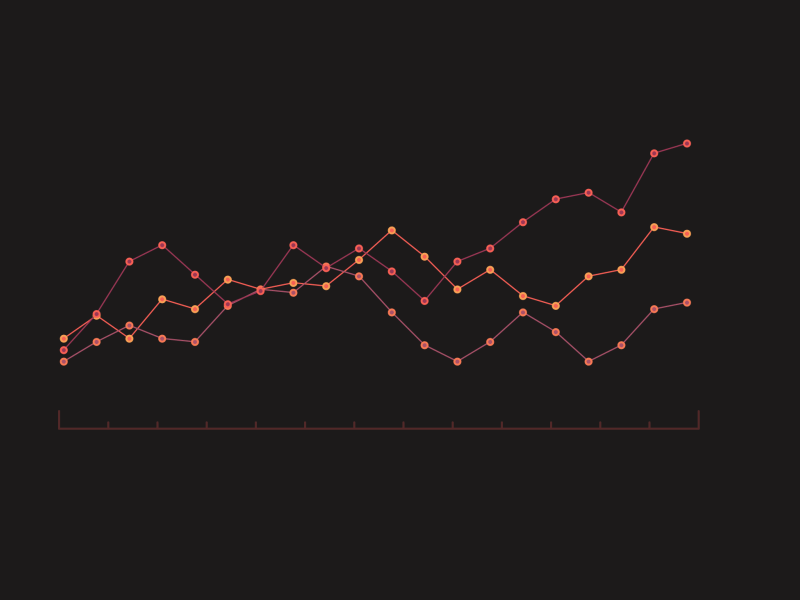

In [51]:
df_order_cnt=tx.groupby("day_no")
df_order_cnt['date_time_of_pickup'].count()

day_no
0    6500
1    6766
2    7047
3    7274
4    7503
5    7480
6    6375
Name: date_time_of_pickup, dtype: int64

In [52]:
df_hrs=tx.groupby("hours")
hrs_cnt=pd.DataFrame(df_hrs['unique_id'].count())

Text(3, 400, 'Minimum')

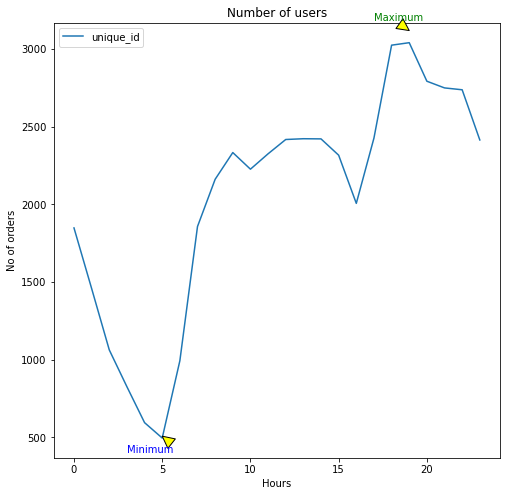

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

hrs_cnt.plot( y="unique_id",
        kind="line", figsize=(8, 8))
 
# display plot
#plt.show()
plt.xlabel('Hours')
plt.ylabel('No of orders')
plt.title('Number of users')
plt.legend()

plt.annotate('Maximum', xy=(19,3118), xytext=(17,3180), c='g',
             arrowprops={'facecolor': 'yellow'})
plt.annotate('Minimum', xy=(5,508), xytext=(3,400), c='b',
             arrowprops={'facecolor': 'yellow'})

## Note- 
### from above plot we can conclude that in the morning from 5.00 am orders starts increasing till 12.00 pm and slightly decreases till evening. from evening to night again order count is more and there is sudden decrease in order upto morning 5.00 am.

Text(6, 12, 'Sunday')

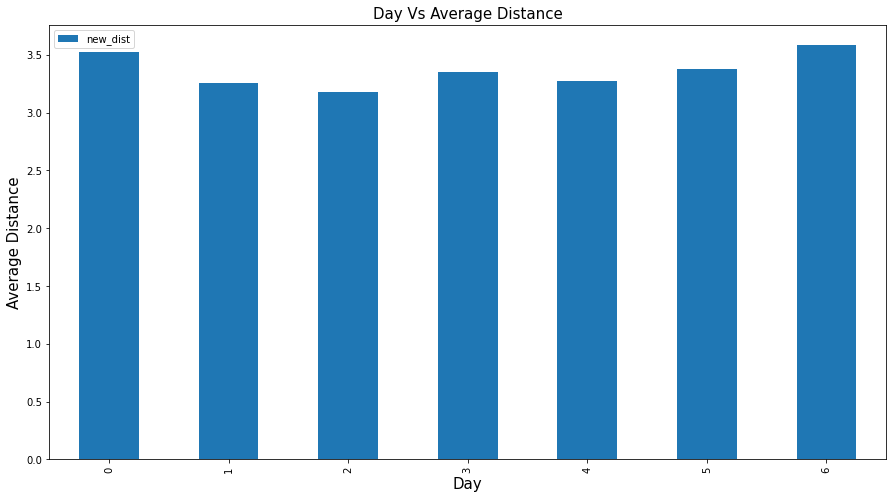

In [55]:
tx.pivot_table(index="day_no",values= "new_dist",aggfunc="mean").plot(figsize=(15,8),kind='bar')
plt.title("Day Vs Average Distance",fontsize=(15))
plt.xlabel("Day",fontsize=(15))
plt.ylabel('Average Distance',fontsize=(15));
plt.annotate('Monday', xy=(0,12),size=15,ha='center', 
         va='center')
plt.annotate('Tuesday', xy=(1,12),size=15,ha='center', 
         va='center')
plt.annotate('Wednesday', xy=(2,12),size=15,ha='center', 
         va='center')
plt.annotate('Thursday', xy=(3,12),size=15,ha='center', 
         va='center')
plt.annotate('Friday', xy=(4,12),size=15,ha='center', 
         va='center')
plt.annotate('Saturday', xy=(5,12),size=15,ha='center', 
         va='center')
plt.annotate('Sunday', xy=(6,12),size=15,ha='center', 
         va='center')
#plt.savefig("Day Vs Average Distance.jpg")

Text(0, 0.5, 'Count of Passengers')

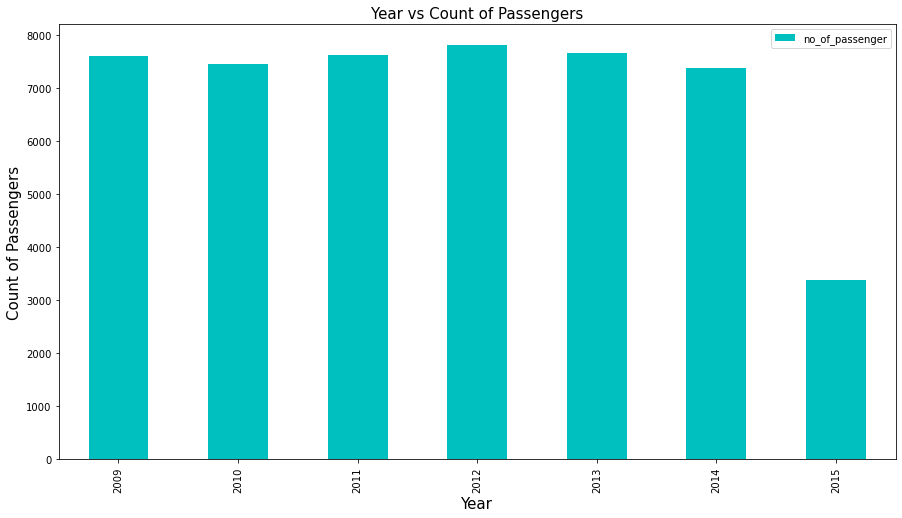

In [56]:
tx.pivot_table(index="year",values= "no_of_passenger",aggfunc="count").plot(figsize=(15,8), kind='bar',color='c')
plt.title("Year vs Count of Passengers",fontsize=(15))
plt.xlabel("Year",fontsize=(15))
plt.ylabel('Count of Passengers',fontsize=(15))


## Note-
### from above graph the count of passengers Vs Year, passenger count over year is approximately equal.In year 2015 passenger count drawdown majorly. 

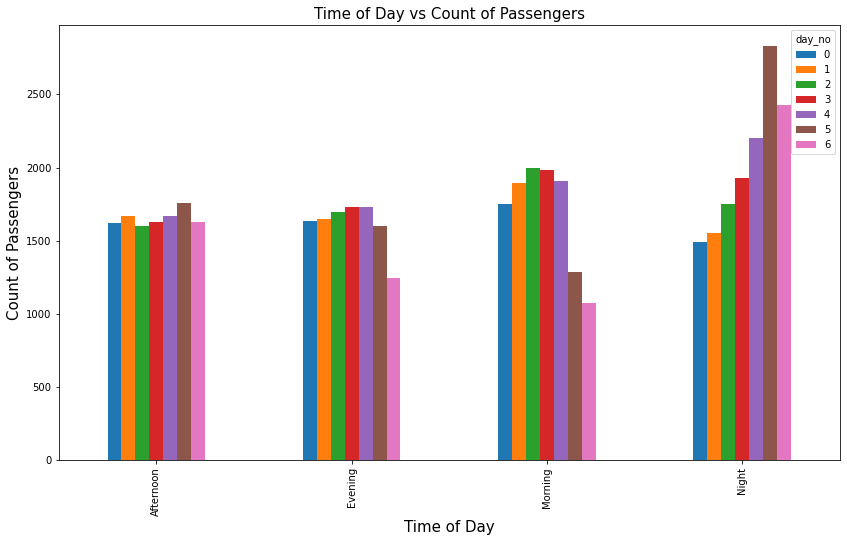

In [57]:
tx.pivot_table(index='time_of_day', columns='day_no', values="no_of_passenger",aggfunc="count").plot(figsize=(14,8),kind='bar')
plt.title("Time of Day vs Count of Passengers",fontsize=(15))
plt.xlabel("Time of Day",fontsize=(15))
plt.ylabel('Count of Passengers',fontsize=(15));

## Note-
### The trend may be seen when looking at the time of day vs. the number of passengers on different days. The majority of passengers travelling at night  on weekends, particularly on Saturday and Sunday, while for other times of day, particularly in the morning.

C:\Users\shubh\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


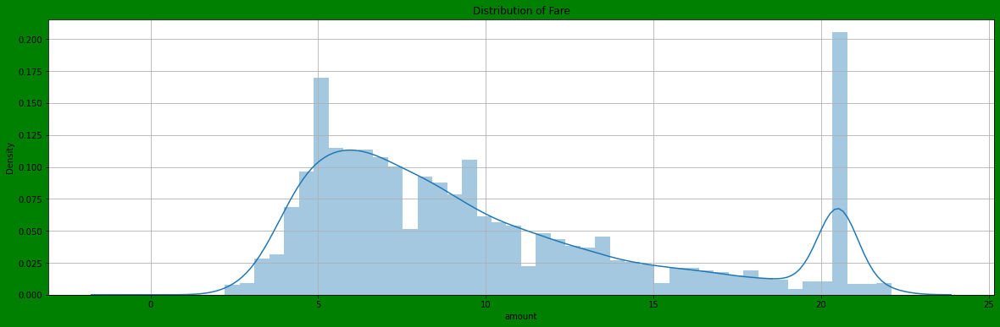

In [58]:
## Fare distribution
plt.figure(figsize = (20, 6),facecolor="green")
sns.distplot(tx['amount'])
plt.title('Distribution of Fare')
plt.grid()

### Note-
#### We checked the distribution of the amount/fare and as it can be seen the distribution is highly skewed. In addition, the density of fare in the range of 0 to 20 is significantly higher. This could indicate that individuals prefer not to use taxi services for lengthy distances because long distances imply a high fare.

###  (4) ML Model

In [59]:
tx.shape

(48945, 18)

In [60]:
tx.corr()

,amount,year,month,date_of_the_month,day_no,hours,longitude_of_pickup,latitude_of_pickup,longitude_of_dropoff,latitude_of_dropoff,no_of_passenger,new_dist
amount,1.000000,0.151429,0.030972,-0.003093,0.014083,-0.024206,0.233985,-0.126827,0.249934,-0.117667,0.019122,0.705208
year,0.151429,1.000000,-0.114964,-0.011371,0.006073,0.005031,0.006091,-0.015941,0.000729,-0.007050,0.007166,0.016792
month,0.030972,-0.114964,1.000000,-0.017510,-0.010798,-0.001110,0.004660,-0.006081,0.001692,-0.000367,0.007912,0.010569
date_of_the_month,-0.003093,-0.011371,-0.017510,1.000000,0.007613,-0.007167,0.001338,-0.001235,0.005944,0.003236,0.006133,-0.000784
day_no,0.014083,0.006073,-0.010798,0.007613,1.000000,-0.091320,-0.029187,-0.043779,-0.004935,-0.025211,0.037755,0.009070
hours,-0.024206,0.005031,-0.001110,-0.007167,-0.091320,1.000000,0.021144,0.029932,-0.042837,0.017524,0.010972,-0.033018
longitude_of_pickup,0.233985,0.006091,0.004660,0.001338,-0.029187,0.021144,1.000000,0.156175,0.398715,0.133902,0.001837,0.422891
latitude_of_pickup,-0.126827,-0.015941,-0.006081,-0.001235,-0.043779,0.029932,0.156175,1.000000,0.149838,0.474315,-0.002824,-0.089228
longitude_of_dropoff,0.249934,0.000729,0.001692,0.005944,-0.004935,-0.042837,0.398715,0.149838,1.000000,0.235411,-0.003792,0.331240
latitude_of_dropoff,-0.117667,-0.007050,-0.000367,0.003236,-0.025211,0.017524,0.133902,0.474315,0.235411,1.000000,-0.007368,-0.088649


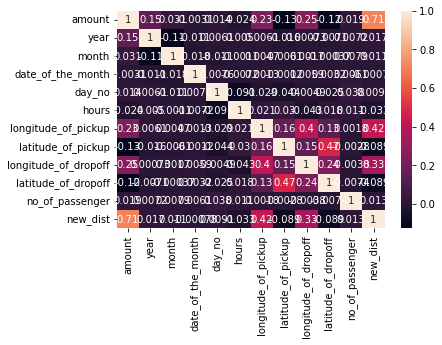

In [61]:
sns.heatmap( tx.corr(), annot=True );

In [62]:
tx2 = tx[['latitude_of_pickup','longitude_of_pickup','latitude_of_dropoff','longitude_of_dropoff','new_dist','no_of_passenger','time_of_day','day_no','year','amount']]

In [63]:
tx3 = pd.get_dummies(tx2,columns=["time_of_day","day_no"])

In [64]:
y = tx3["amount"]
X = tx3.drop(columns=["amount"])

#### Splitting the Data into Train and Test

In [65]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1, test_size=0.3)

In [66]:
X.head(50)

,latitude_of_pickup,longitude_of_pickup,latitude_of_dropoff,longitude_of_dropoff,new_dist,no_of_passenger,year,time_of_day_Afternoon,time_of_day_Evening,time_of_day_Morning,time_of_day_Night,day_no_0,day_no_1,day_no_2,day_no_3,day_no_4,day_no_5,day_no_6
0,40.721319,-73.844311,40.712278,-73.841610,1.029601,1,2009,0,1,0,0,1,0,0,0,0,0,0
1,40.711303,-74.016048,40.782004,-73.979268,8.443441,1,2010,1,0,0,0,0,1,0,0,0,0,0
2,40.761270,-73.982738,40.750562,-73.991242,1.389132,2,2011,0,0,0,1,0,0,0,1,0,0,0
3,40.733143,-73.987130,40.758092,-73.991567,2.795790,1,2012,0,0,0,1,0,0,0,0,0,1,0
4,40.768008,-73.968095,40.783762,-73.956655,1.998338,1,2010,0,0,1,0,0,1,0,0,0,0,0
5,40.731630,-74.000964,40.758233,-73.972892,3.787980,1,2011,0,0,1,0,0,0,0,1,0,0,0
6,40.751662,-73.980002,40.764842,-73.973802,1.554446,1,2012,0,1,0,0,0,1,0,0,0,0,0
7,40.774138,-73.951300,40.751048,-73.990095,4.159930,1,2012,0,1,0,0,0,0,1,0,0,0,0
8,40.726713,-74.006462,40.731628,-73.993078,1.255507,1,2012,1,0,0,0,1,0,0,0,0,0,0
9,40.733873,-73.980658,40.758138,-73.991540,2.847028,2,2009,0,0,0,1,0,0,1,0,0,0,0


#### Using KNeighborsRegressor

In [67]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score

In [68]:
knn = KNeighborsRegressor()

In [69]:
knn.fit(X_train, y_train)

KNeighborsRegressor()

In [70]:
y_p=knn.predict(X_test)

In [71]:
r2_score(y_test,y_p)

0.758410750531261

In [72]:
y_p

array([9.24, 6.82, 5.46, ..., 9.88, 7.26, 5.06])

In [73]:
dfr=pd.DataFrame({'Actual':y_test,'Predicted':y_p})

In [74]:
dfr.head(20)

,Actual,Predicted
49617,7.7,9.24
47152,6.9,6.82
1308,3.3,5.46
39738,11.5,9.10
15202,7.5,5.80
36055,4.9,4.90
1941,4.9,6.68
21312,20.5,13.06
15053,9.0,9.80
29917,12.5,11.84


In [75]:
graph=dfr.head(20)

<AxesSubplot:>

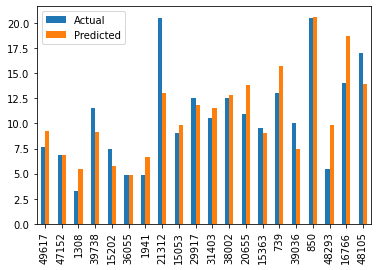

In [76]:
graph.plot(kind='bar')

#### Using RandomForest Regressor

In [77]:
from sklearn.ensemble import RandomForestRegressor

In [78]:
rf2 = RandomForestRegressor()
rf2.fit(X_train,y_train)


RandomForestRegressor()

In [79]:
y_pre=rf2.predict(X_test)

In [80]:
r2_score(y_test,y_pre)

0.8103915150674011

In [81]:
dfr2=pd.DataFrame({'Actual':y_test,'Predicted':y_pre})

In [82]:
dfr2.head(20)

,Actual,Predicted
49617,7.7,7.933
47152,6.9,4.939
1308,3.3,4.921
39738,11.5,11.270
15202,7.5,5.515
36055,4.9,5.095
1941,4.9,6.123
21312,20.5,11.691
15053,9.0,10.355
29917,12.5,9.794


## Grid SearchCV

In [83]:
from sklearn.model_selection import GridSearchCV
param = {"n_estimators":[20,50],"max_depth": [3,5],"min_samples_split":[2,4],
                "min_samples_leaf":[2,4]}

rf3 = RandomForestRegressor()
Grid_search = GridSearchCV(estimator = rf3, param_grid=param,cv=5,n_jobs=-1)
Grid_search.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [3, 5], 'min_samples_leaf': [2, 4],
                         'min_samples_split': [2, 4],
                         'n_estimators': [20, 50]})

In [84]:
print("Test R2",Grid_search.score(X_test,y_test))

Test R2 0.7915384931363072


In [85]:
graph=dfr2.head(20)

<AxesSubplot:>

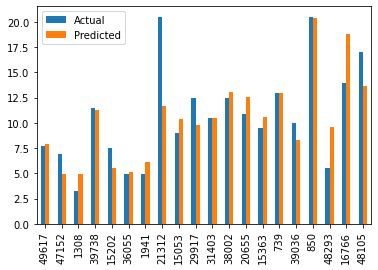

In [86]:
graph.plot(kind='bar')

## XG Boosting

In [88]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [89]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [90]:
model5 = XGBRegressor()

In [91]:
model5.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [92]:
y_pre5=model5.predict(X_test)
r2_score(y_test,y_pre5)

0.8196704736992316

In [93]:
print(f'KNN Model Accuracy: {r2_score(y_test,y_p)}')
print(f'Random forest Model Accuracy: {r2_score(y_test,y_pre)}')
print(f'Grid Serach CV Model Accuracy: {Grid_search.score(X_test,y_test)}')
print(f'XG Boosting Model Accuracy: {r2_score(y_test,y_pre5)}')

KNN Model Accuracy: 0.758410750531261
Random forest Model Accuracy: 0.8103915150674011
Grid Serach CV Model Accuracy: 0.7915384931363072
XG Boosting Model Accuracy: 0.8196704736992316


### (5) Map:
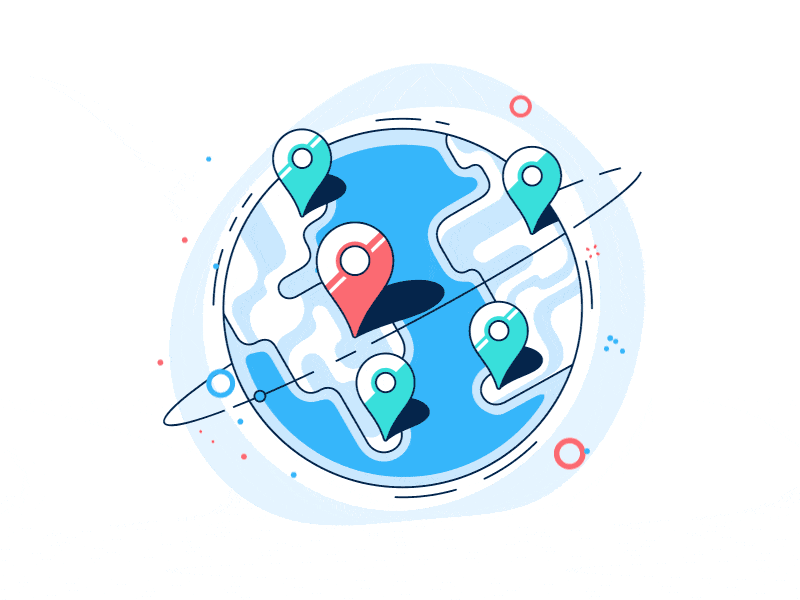

In [94]:
import folium
 
my_map4 = folium.Map(location = [40.711303, -74.016048],
                                        zoom_start = 12)
folium.Marker([40.711303, -74.016048],
              popup = 'pickup_location').add_to(my_map4)
my_map4


In [95]:
my_map4 = folium.Map(location = (40.721319,-73.844311),
                                        zoom_start = 15)
 
folium.Marker([40.721319,-73.844311],
               popup = ' pickup_location ').add_to(my_map4)
folium.Marker([40.712278,-73.841610],
               popup = 'Drop_location ').add_to(my_map4)

folium.PolyLine(locations = [(40.721319,-73.844311), (40.712278,-73.841610)],
                line_opacity = 0.5).add_to(my_map4)
my_map4

# Clustering
## Clustering is a classic data mining technique based on machine learning that divides groups of abstract objects into classes of similar objects.

## Clustering helps to split data into several subsets. Each of these clusters consists of data objects with high inter-similarity and low intra-similarity.
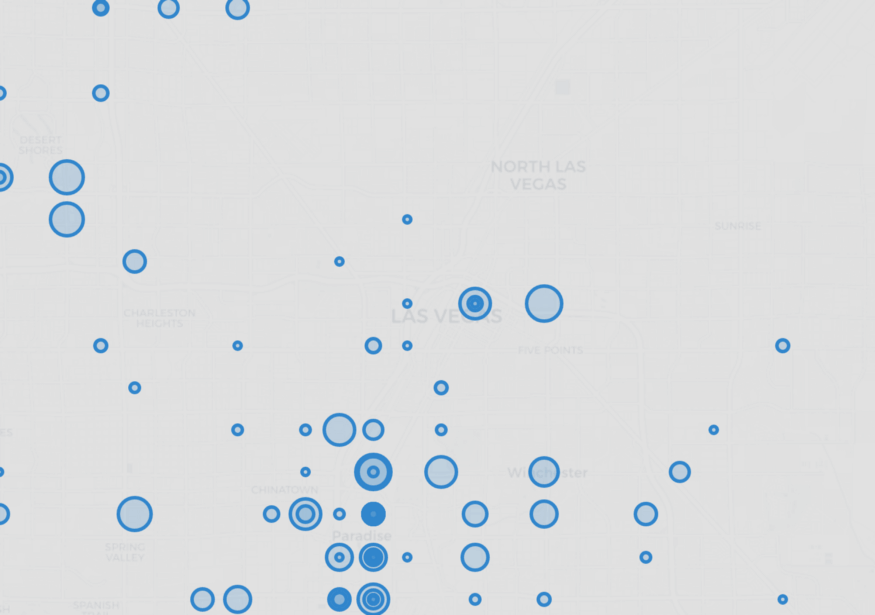

In [97]:
new_df=tx3[["amount","new_dist"]]

In [98]:
new_df

,amount,new_dist
0,4.5,1.029601
1,16.9,8.443441
2,5.7,1.389132
3,7.7,2.795790
4,5.3,1.998338
...,...,...
49995,15.0,4.935469
49996,7.5,0.873774
49997,6.9,2.260573
49998,4.5,0.666621


In [99]:
max(new_df["amount"])

22.1

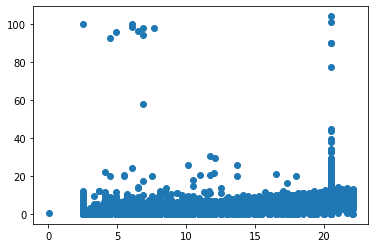

In [100]:
plt.scatter(new_df["amount"],new_df["new_dist"])
plt.show()

In [101]:
Y=new_df[["new_dist"]]
X=new_df[["amount"]]

In [102]:
X_norm=(X-X.mean())/(X.max()-X.min())
Y_norm=(Y-Y.mean())/(Y.max()-Y.min())

In [103]:
X_norm

,amount
0,-0.247063
1,0.314277
2,-0.192740
3,-0.102201
4,-0.210848
...,...
49995,0.228265
49996,-0.111255
49997,-0.138417
49998,-0.247063


In [104]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
pca=PCA(n_components=1).fit(Y)
pca_d=pca.transform(Y)
pca_c=pca.transform(X)

C:\Users\shubh\anaconda3\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- amount
Feature names seen at fit time, yet now missing:
- new_dist

  warnings.warn(message, FutureWarning)


In [105]:
kmeans=KMeans(n_clusters=3)

kmeansoutput=kmeans.fit(Y)
print(kmeansoutput)

KMeans(n_clusters=3)


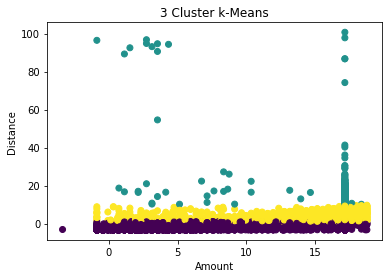

In [106]:
import matplotlib.pyplot as plt
plt.figure('3 Cluster k-Means')
plt.scatter(pca_c[:,0],pca_d[:,0],c=kmeansoutput.labels_)
plt.xlabel('Amount')
plt.ylabel('Distance')
plt.title('3 Cluster k-Means')
plt.show()

## Time Series

In [107]:
time_taxi=tx[['date_time_of_pickup','amount']]

In [108]:
time_taxi.set_index('date_time_of_pickup',inplace=True)

In [109]:
time_taxi.resample(rule="A").count()

,amount
date_time_of_pickup,
2009-12-31,7611
2010-12-31,7458
2011-12-31,7624
2012-12-31,7812
2013-12-31,7666
2014-12-31,7390
2015-12-31,3384


In [110]:
daily_ser=time_taxi.resample(rule="D").mean()

In [111]:
daily_ser

,amount
date_time_of_pickup,
2009-01-01,9.833333
2009-01-02,7.470000
2009-01-03,9.822727
2009-01-04,8.600000
2009-01-05,7.447059
...,...
2015-06-26,8.583333
2015-06-27,9.442308
2015-06-28,13.500000


In [112]:
hr_ser=time_taxi.resample(rule='H').count()

In [113]:
hr_ser

,amount
date_time_of_pickup,
2009-01-01 01:00:00,1
2009-01-01 02:00:00,3
2009-01-01 03:00:00,1
2009-01-01 04:00:00,1
2009-01-01 05:00:00,0
...,...
2015-06-30 18:00:00,0
2015-06-30 19:00:00,2
2015-06-30 20:00:00,1


In [114]:
train=daily_ser.iloc[:2100]
test=daily_ser.iloc[2100:]

In [115]:
len(daily_ser['amount'])

2372

In [116]:
def round_up(num):
    num=round(num,2)
    return num

In [117]:
daily_ser["amt"]=daily_ser["amount"].apply(round_up)

In [118]:
daily_ser2=daily_ser.drop(["amount"],axis=1)
daily_ser3=daily_ser2.iloc[:2372,:]
daily_ser3

,amt
date_time_of_pickup,
2009-01-01,9.83
2009-01-02,7.47
2009-01-03,9.82
2009-01-04,8.60
2009-01-05,7.45
...,...
2015-06-26,8.58
2015-06-27,9.44
2015-06-28,13.50


In [119]:
daily_ser3.isnull().sum()

amt    1
dtype: int64

In [120]:
daily_ser3=daily_ser3.dropna()

In [121]:
from statsmodels.tsa.api import seasonal_decompose as sd
from pylab import rcParams

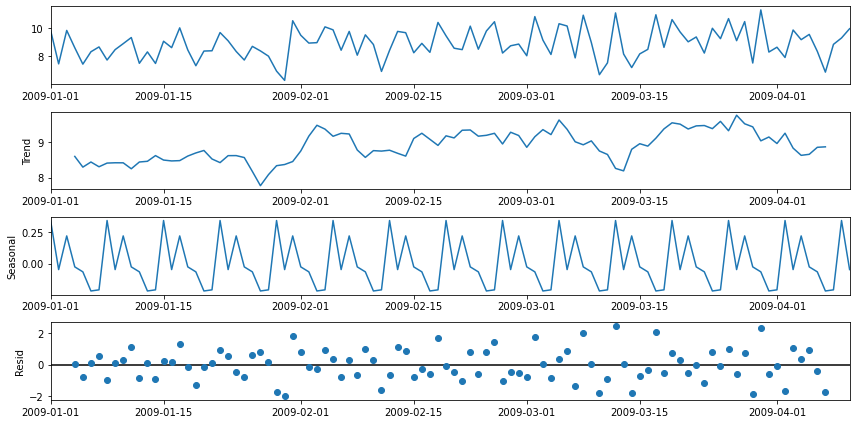

In [122]:
rcParams['figure.figsize']=12,6
sd(daily_ser3.iloc[:100]).plot();

In [123]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

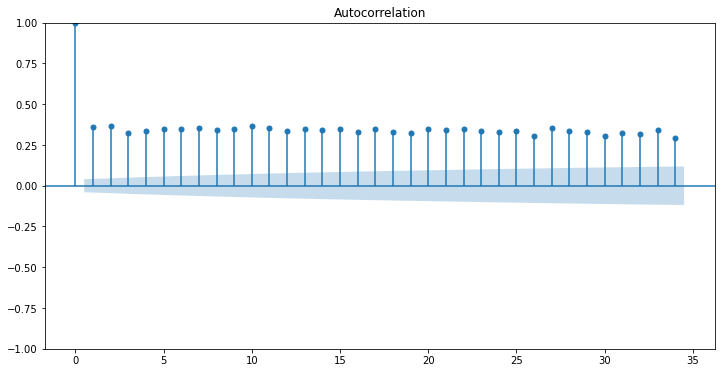

In [124]:
plot_acf(daily_ser3['amt']);

In [149]:
from statsmodels.tsa.stattools import adfuller
print('Augmented Dickey_Fuller Test Taxi Data')
dftest = adfuller(daily_ser3['amt'])
dftest

Augmented Dickey_Fuller Test Taxi Data


(-2.511621772424752,
 0.11267216847229855,
 27,
 2343,
 {'1%': -3.4331440583819224,
  '5%': -2.8627743637979775,
  '10%': -2.5674271058003892},
 7570.241187108621)

In [125]:
daily_ser3

,amt
date_time_of_pickup,
2009-01-01,9.83
2009-01-02,7.47
2009-01-03,9.82
2009-01-04,8.60
2009-01-05,7.45
...,...
2015-06-26,8.58
2015-06-27,9.44
2015-06-28,13.50


In [126]:
daily_ser3['30_days_SMA']=daily_ser3['amt'].rolling(window=30).mean()
daily_ser3['90_days_SMA']=daily_ser3['amt'].rolling(window=90).mean()

C:\Users\shubh\AppData\Local\Temp\ipykernel_13796\4156602558.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_ser3['30_days_SMA']=daily_ser3['amt'].rolling(window=30).mean()
C:\Users\shubh\AppData\Local\Temp\ipykernel_13796\4156602558.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_ser3['90_days_SMA']=daily_ser3['amt'].rolling(window=90).mean()


<AxesSubplot:xlabel='date_time_of_pickup'>

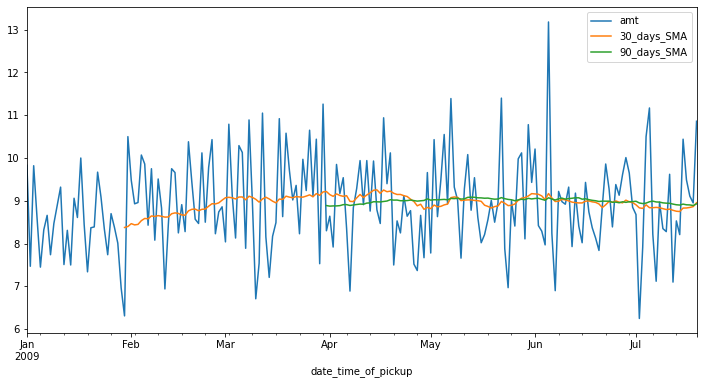

In [127]:
daily_ser3.iloc[:200].plot()

In [142]:
# exponential weighted moving avarage
daily_ser3['EWMA30']=daily_ser3["amt"].ewm(span=30,adjust=False).mean()

<AxesSubplot:xlabel='date_time_of_pickup'>

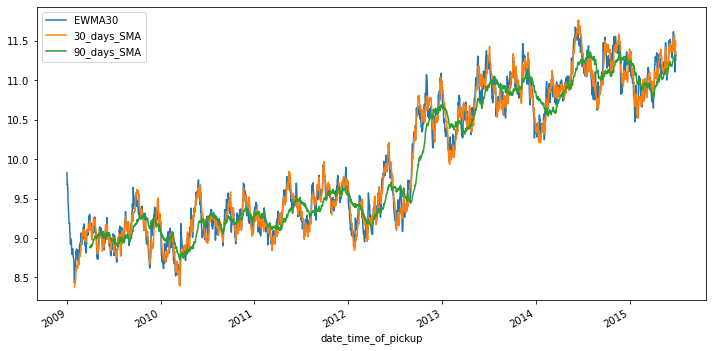

In [129]:
daily_ser3[['EWMA30','30_days_SMA','90_days_SMA']].plot()

In [130]:
daily_ser3

,amt,30_days_SMA,90_days_SMA,EWMA30
date_time_of_pickup,,,,
2009-01-01,9.83,NaN,NaN,9.830000
2009-01-02,7.47,NaN,NaN,9.677742
2009-01-03,9.82,NaN,NaN,9.686920
2009-01-04,8.60,NaN,NaN,9.616796
2009-01-05,7.45,NaN,NaN,9.477003
...,...,...,...,...
2015-06-26,8.58,11.406000,11.289444,11.222762
2015-06-27,9.44,11.321667,11.278444,11.107745
2015-06-28,13.50,11.474000,11.295111,11.262084


In [143]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing

span=30
alpha=2/(span+1)
daily_ser3["SES30"]=SimpleExpSmoothing(daily_ser3['amt']).fit(smoothing_level=alpha,optimized=False).fittedvalues.shift(-1)


C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [144]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
daily_ser3['DSEadd30']=ExponentialSmoothing(daily_ser3['amt'],trend='add').fit().fittedvalues.shift(-1)
daily_ser3.head(15)

C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


,amt,EWMA30,SES30,DSEadd30
date_time_of_pickup,,,,
2009-01-01,9.83,9.830000,9.830000,8.728776
2009-01-02,7.47,9.677742,9.677742,8.698514
2009-01-03,9.82,9.686920,9.686920,8.727554
2009-01-04,8.60,9.616796,9.616796,8.725476
2009-01-05,7.45,9.477003,9.477003,8.694798
2009-01-06,8.32,9.402357,9.402357,8.686560
2009-01-07,8.66,9.354463,9.354463,8.686998
2009-01-08,7.74,9.250304,9.250304,8.664504
2009-01-09,8.47,9.199962,9.199962,8.660757


In [133]:
daily_ser3['TESmul30']=ExponentialSmoothing(daily_ser3['amt'],trend='mul',seasonal='add',seasonal_periods=30).fit().fittedvalues.shift(-1)
daily_ser3.head(20)

C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err
C:\Users\shubh\AppData\Local\Temp\ipykernel_13796\3530352613.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  daily_ser3['TESmul30']=ExponentialSmoothing(daily_ser3['amt'],trend='mul',seasonal='add',seasonal_periods=30).fit().fittedvalues.shift(-1)


,amt,30_days_SMA,90_days_SMA,EWMA30,SES30,DSEadd30,TESmul30
date_time_of_pickup,,,,,,,
2009-01-01,9.83,NaN,NaN,9.830000,9.830000,8.728776,8.758727
2009-01-02,7.47,NaN,NaN,9.677742,9.677742,8.698514,8.710321
2009-01-03,9.82,NaN,NaN,9.686920,9.686920,8.727554,8.868074
2009-01-04,8.60,NaN,NaN,9.616796,9.616796,8.725476,8.817408
2009-01-05,7.45,NaN,NaN,9.477003,9.477003,8.694798,8.899817
2009-01-06,8.32,NaN,NaN,9.402357,9.402357,8.686560,8.639799
2009-01-07,8.66,NaN,NaN,9.354463,9.354463,8.686998,8.476966
2009-01-08,7.74,NaN,NaN,9.250304,9.250304,8.664504,8.586160
2009-01-09,8.47,NaN,NaN,9.199962,9.199962,8.660757,8.608929


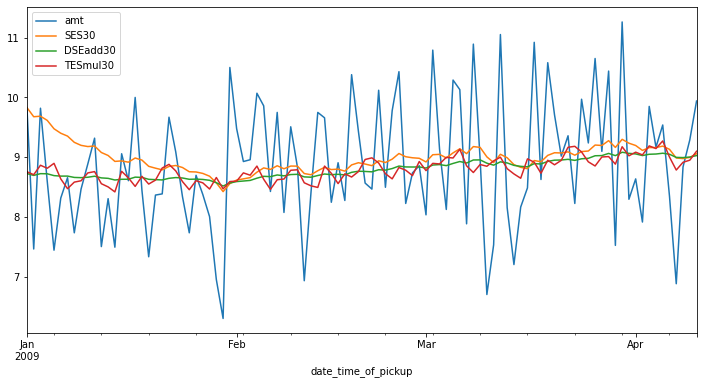

In [134]:
daily_ser3[['amt','SES30','DSEadd30','TESmul30']].iloc[:100].plot(figsize=(12,6)).autoscale(axis='x',tight=True)

In [135]:
daily_ser3=daily_ser3.drop(['EWMA30','30_days_SMA','90_days_SMA','SES30','DSEadd30','TESmul30'],axis=1)

In [136]:
train_data=daily_ser3.iloc[:2100,]
test_data=daily_ser3.iloc[2100:]

In [137]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
fitted_model=ExponentialSmoothing(train_data["amt"],trend='mul',seasonal='mul',seasonal_periods=30).fit()

C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\holtwinters\model.py:83: RuntimeWarning: overflow encountered in matmul
  return err.T @ err


In [138]:
test_data.head()

,amt
date_time_of_pickup,
2014-10-03,10.87
2014-10-04,10.15
2014-10-05,10.18
2014-10-06,12.08
2014-10-07,11.16


In [139]:
test_data.columns

Index(['amt'], dtype='object')

In [140]:
test_predictions=fitted_model.forecast().rename('Dw Forecast')
test_predictions

C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


2100    11.227942
Name: Dw Forecast, dtype: float64

In [141]:
fitted_model.forecast(30)

C:\Users\shubh\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


2100    11.227942
2101    11.338863
2102    11.300645
2103    11.445906
2104    11.249985
2105    11.466948
2106    11.171864
2107    10.999354
2108    11.199539
2109    11.217429
2110    11.304974
2111    11.351144
2112    11.167486
2113    11.129519
2114    11.161358
2115    11.388049
2116    11.356455
2117    11.095089
2118    11.407008
2119    11.077825
2120    11.302445
2121    11.459537
2122    11.561933
2123    11.449951
2124    11.302391
2125    11.153080
2126    11.396565
2127    11.301863
2128    11.129013
2129    11.332805
dtype: float64

# Conclusion
## - ML model giving accuracy of 82.08 % which is quite good to predict fare price .
## - Mojarity of customer are using taxi for short distance .
## - This trend is identify from clustering it will be helpfull to company for making growth.    
## - Time-series show stabilty in business 